# Introduction

## Classification task

The classification task is based on the DBpedia dataset. The DBpedia ontology classification dataset is constructed by picking 14 non-overlapping classes from DBpedia 2014. From each of thse 14 ontology classes, there are 40,000 training samples and 5,000 testing samples. Therefore, the total size of the training dataset is 560,000 and testing dataset 70,000. There are 3 columns in the dataset (same for train and test splits), corresponding to class index (1 to 14), title 
and content.

The state of the art for this dataset can be observed in the paper *Character-level Convolutional Networks for Text
Classification*, where the following image regarding the results of different methods can be observed:

<img src="SoA.png" width="500" height="340">

It can be noticed how the best model is ngrams with TF-IDF which obtains a 98.69% of accuracy, while LSTM gets a 98.55% of accuracy.

Regarding the random classifier, which is an interesting baseline to compare our models with, achieves an accuracy of around 7.1%.

## Metrics chosen

The chosen metrics to evaluate the models will be the following, taking into account that we are facing a classification task;

+ Accuracy: The proportion of correctly classified instances to the total number of instances in a dataset.
+ Precision: The proportion of true positives to the total number of positive predictions made by the model.
+ Recall: The proportion of true positives to the total number of actual positive instances in the dataset.
+ F1: A measure that balances precision and recall by taking their harmonic mean.

# Imports

In [5]:
import json
import pandas as pd
import numpy as np
from datasets import load_dataset, get_dataset_split_names, get_dataset_config_names
import seaborn as sns
sns.set_style("whitegrid")
sns.set_palette(sns.color_palette("pastel"))
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
from lime import lime_text
from lime.lime_text import LimeTextExplainer
import spacy
import os
import ast
from gensim.models import Word2Vec
from gensim import downloader
import string
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Dropout, LSTM, Bidirectional, Embedding, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import tensorflow as tf
from tensorflow.keras.metrics import Precision, Recall, Accuracy
import datetime
import pickle
import sys
import scipy as sp
import platform
import torch
from tqdm.notebook import tqdm
from transformers import BertTokenizer, BertForSequenceClassification
from torch.utils.data import TensorDataset

print(f"Python Platform: {platform.platform()}")
print(f"Tensor Flow Version: {tf.__version__}")
print(f"Keras Version: {tf.keras.__version__}")
print()
print(f"Python {sys.version}")
print(f"Pandas {pd.__version__}")
import sklearn as sk
print(f"Scikit-Learn {sk.__version__}")
print(f"SciPy {sp.__version__}")
gpu = len(tf.config.list_physical_devices('GPU')) > 0
print("GPU is", "available" if gpu else "NOT AVAILABLE")


Python Platform: macOS-10.16-x86_64-i386-64bit
Tensor Flow Version: 2.12.0
Keras Version: 2.12.0

Python 3.8.10 (v3.8.10:3d8993a744, May  3 2021, 08:55:58) 
[Clang 6.0 (clang-600.0.57)]
Pandas 1.5.3
Scikit-Learn 0.24.1
SciPy 1.9.3
GPU is NOT AVAILABLE


# Data preview

In [20]:
import requests
API_URL = "https://datasets-server.huggingface.co/first-rows?dataset=dbpedia_14&config=dbpedia_14&split=train"
def query():
    response = requests.request("GET", API_URL)
    return response.json()
data = query()


In [21]:
data.keys()

dict_keys(['dataset', 'config', 'split', 'features', 'rows'])

In [22]:
pd.DataFrame([line["row"] for line in data["rows"]])

,label,title,content
0,0,E. D. Abbott Ltd,Abbott of Farnham E D Abbott Limited was a Br...
1,0,Schwan-Stabilo,Schwan-STABILO is a German maker of pens for ...
2,0,Q-workshop,Q-workshop is a Polish company located in Poz...
3,0,Marvell Software Solutions Israel,Marvell Software Solutions Israel known as RA...
4,0,Bergan Mercy Medical Center,Bergan Mercy Medical Center is a hospital loc...
...,...,...,...
95,0,Aegon,Aegon N.V. is a multinational life insurance ...
96,0,Parliamentary Monitoring Services,Parliamentary Monitoring Services is a United...
97,0,Rossiya Bank,The Rossiya Bank (Bank Rossiya in Russian: Ак...
98,0,Third Wire,Third Wire Productions Inc. (also known simpl...


# Data downloading

In [23]:
get_dataset_split_names("dbpedia_14")

['train', 'test']

In [24]:
get_dataset_config_names("dbpedia_14")

['dbpedia_14']

In [25]:
data_train = load_dataset("dbpedia_14", split = "train")
data_test = load_dataset("dbpedia_14", split = "test")

Found cached dataset dbpedia_14 (/Users/luisquinonespr/.cache/huggingface/datasets/dbpedia_14/dbpedia_14/2.0.0/01dab9e10d969eadcdbc918be5a09c9190a24caeae33b10eee8f367a1e3f1f0c)
Found cached dataset dbpedia_14 (/Users/luisquinonespr/.cache/huggingface/datasets/dbpedia_14/dbpedia_14/2.0.0/01dab9e10d969eadcdbc918be5a09c9190a24caeae33b10eee8f367a1e3f1f0c)


In [26]:
data_train

Dataset({
    features: ['label', 'title', 'content'],
    num_rows: 560000
})

In [27]:
data_test

Dataset({
    features: ['label', 'title', 'content'],
    num_rows: 70000
})

In [28]:
# For some reason slicing loads faster the dataset (23s vs 1.9s)
df_train = pd.DataFrame(data_train[:560000])
df_train

,label,title,content
0,0,E. D. Abbott Ltd,Abbott of Farnham E D Abbott Limited was a Br...
1,0,Schwan-Stabilo,Schwan-STABILO is a German maker of pens for ...
2,0,Q-workshop,Q-workshop is a Polish company located in Poz...
3,0,Marvell Software Solutions Israel,Marvell Software Solutions Israel known as RA...
4,0,Bergan Mercy Medical Center,Bergan Mercy Medical Center is a hospital loc...
...,...,...,...
559995,13,Barking in Essex,Barking in Essex is a Black comedy play direc...
559996,13,Science & Spirit,Science & Spirit is a discontinued American b...
559997,13,The Blithedale Romance,The Blithedale Romance (1852) is Nathaniel Ha...
559998,13,Razadarit Ayedawbon,Razadarit Ayedawbon (Burmese: ရာဇာဓိရာဇ် အရေး...


In [29]:
# it has only 70000 rows, but for some reason slicing loads faster the dataset
df_test = pd.DataFrame(data_test[:70000])
df_test.head()

,label,title,content
0,0,TY KU,TY KU /taɪkuː/ is an American alcoholic bever...
1,0,Odd Lot Entertainment,OddLot Entertainment founded in 2001 by longt...
2,0,Henkel,Henkel AG & Company KGaA operates worldwide w...
3,0,GOAT Store,The GOAT Store (Games Of All Type Store) LLC ...
4,0,RagWing Aircraft Designs,RagWing Aircraft Designs (also called the Rag...


### Labels distribution

The data is completely balanced, as shown in the plots

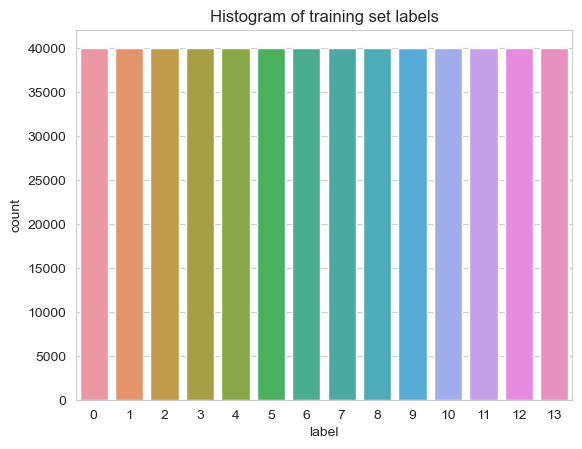

In [31]:
ax = sns.countplot(x=df_train["label"])
ax.set(title = "Histogram of training set labels")
plt.show()

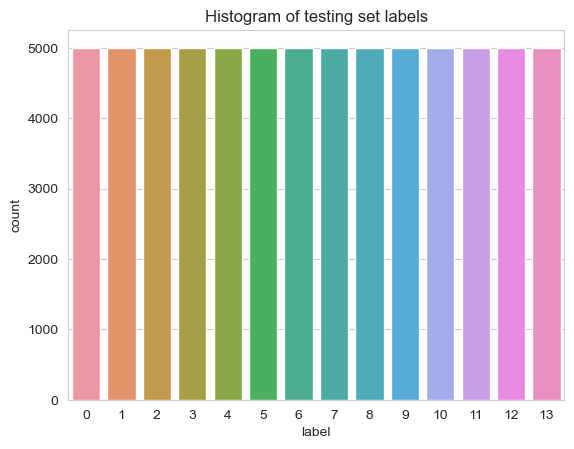

In [32]:
ax = sns.countplot(x=df_test["label"])
ax.set(title = "Histogram of testing set labels")
plt.show()

### Cleaning data:

We have some text with non-english characters

In [33]:
def isEnglish(s):
    try:
        s["content"].encode(encoding='utf-8').decode('ascii')
        s["title"].encode(encoding='utf-8').decode('ascii')
    except UnicodeDecodeError:
        pass
    else:
        return s

In [34]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 560000 entries, 0 to 559999
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   label    560000 non-null  int64 
 1   title    560000 non-null  object
 2   content  560000 non-null  object
dtypes: int64(1), object(2)
memory usage: 12.8+ MB


In [35]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   label    70000 non-null  int64 
 1   title    70000 non-null  object
 2   content  70000 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.6+ MB


In [36]:
df_train_with_na = df_train.apply(isEnglish, axis=1)
df_test_with_na = df_test.apply(isEnglish, axis=1)


In [37]:
examples_non_english_train = df_train[df_train_with_na.isna()].dropna(how="any")
examples_non_english_train.head()

,label,title,content
2,0.0,Q-workshop,Q-workshop is a Polish company located in Poz...
10,0.0,Angstrem (company),Angstrem Group (Russian: ОАО «Ангстрем» named...
12,0.0,JVC,Victor Company of Japan Ltd (日本ビクター株式会社 Nippo...
13,0.0,Toei Bus,The Toei Bus (都営バス Toei Basu) is a bus servic...
18,0.0,CIB Bank,CIB Bank is the second-biggest commercial ban...


In [38]:
examples_non_english_test = df_test[df_test_with_na.isna()].dropna(how="any")
examples_non_english_test.head()

,label,title,content
0,0,TY KU,TY KU /taɪkuː/ is an American alcoholic bever...
2,0,Henkel,Henkel AG & Company KGaA operates worldwide w...
5,0,Pošte Srpske,Pošte Srpske is one of three companies respon...
13,0,Shell Oil Company,Shell Oil Company is the United States-based ...
22,0,Korchma Taras Bulba,Korchma Taras Bulba – the chain of restaurant...


In [39]:
clean_df_train = df_train_with_na.dropna(how="any")
clean_df_train

,label,title,content
0,0.0,E. D. Abbott Ltd,Abbott of Farnham E D Abbott Limited was a Br...
1,0.0,Schwan-Stabilo,Schwan-STABILO is a German maker of pens for ...
3,0.0,Marvell Software Solutions Israel,Marvell Software Solutions Israel known as RA...
4,0.0,Bergan Mercy Medical Center,Bergan Mercy Medical Center is a hospital loc...
5,0.0,The Unsigned Guide,The Unsigned Guide is an online contacts dire...
...,...,...,...
559994,13.0,Scoliosis (journal),Scoliosis (ISSN 1748-7161) is an open-access ...
559995,13.0,Barking in Essex,Barking in Essex is a Black comedy play direc...
559996,13.0,Science & Spirit,Science & Spirit is a discontinued American b...
559997,13.0,The Blithedale Romance,The Blithedale Romance (1852) is Nathaniel Ha...


In [40]:
clean_df_test = df_test[~df_test_with_na.isna()]
clean_df_test.head()

,label,title,content
1,0,Odd Lot Entertainment,OddLot Entertainment founded in 2001 by longt...
3,0,GOAT Store,The GOAT Store (Games Of All Type Store) LLC ...
4,0,RagWing Aircraft Designs,RagWing Aircraft Designs (also called the Rag...
6,0,Open Kernel Labs,Open Kernel Labs (OK Labs) is a privately own...
7,0,Skye Bank,Skye Bank Plc. commonly known as Skye Bank is...


Deleting rows containing non-english characters has made the dataset unbalanced. This is something to take into account for future iterations. 

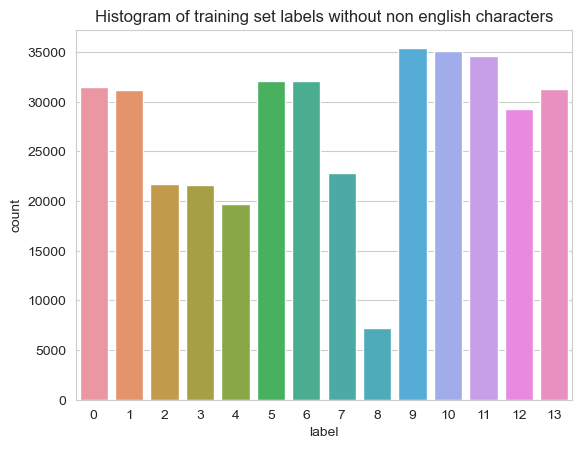

In [41]:
ax = sns.countplot(x=clean_df_train["label"].astype(int))
ax.set(title = "Histogram of training set labels without non english characters")
plt.show()

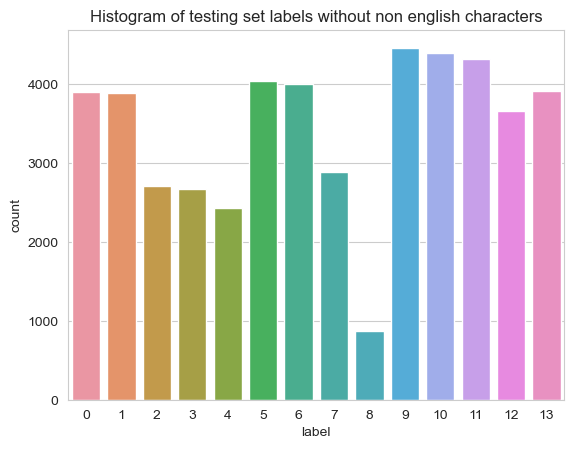

In [42]:
ax = sns.countplot(x=clean_df_test["label"])
ax.set(title = "Histogram of testing set labels without non english characters")
plt.show()

### Saving the data in reduced csv files

In [43]:
clean_df_train.to_csv('data/csv/clean_df_train.csv', index=False)
clean_df_test.to_csv('data/csv/clean_df_test.csv', index=False)

In [1]:
# from google.colab import drive
# drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [44]:
# load the data from the preprocessing stage
data_train = pd.read_csv('data/csv/clean_df_train.csv')
data_test = pd.read_csv('data/csv/clean_df_train.csv')

# Baseline model

### Data Pre-Processing

In [45]:
X_train = data_train['content'].values
X_test = data_test['content'].values
y_train = data_train['label'].values
y_test = data_test['label'].values

The CountVectorizer is tokenising the data and puts it in a document term matrix.

In [46]:
vectorizer = CountVectorizer()
vectorizer.fit(X_train)

CountVectorizer()

In [50]:
X_train = vectorizer.transform(X_train)
X_test  = vectorizer.transform(X_test)

### Model

In [51]:
clf = LogisticRegression()
clf.fit(X_train, y_train)

/Users/luisquinonespr/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [52]:
y_predictions = clf.predict(X_test)
y_predictions[0:3]

array([0., 0., 0.])

In [53]:
class_names = ['Company', 'EducationalInstitution', 'Artist', 'Athlete', 'OfficeHolder',
              'MeanOfTransportation', 'Building', 'NaturalPlace', 'Village', 'Animal',
              'Plant', 'Album', 'Film','WrittenWork']

### Model Evaluation

Text(160.22222222222223, 0.5, 'Predicted')

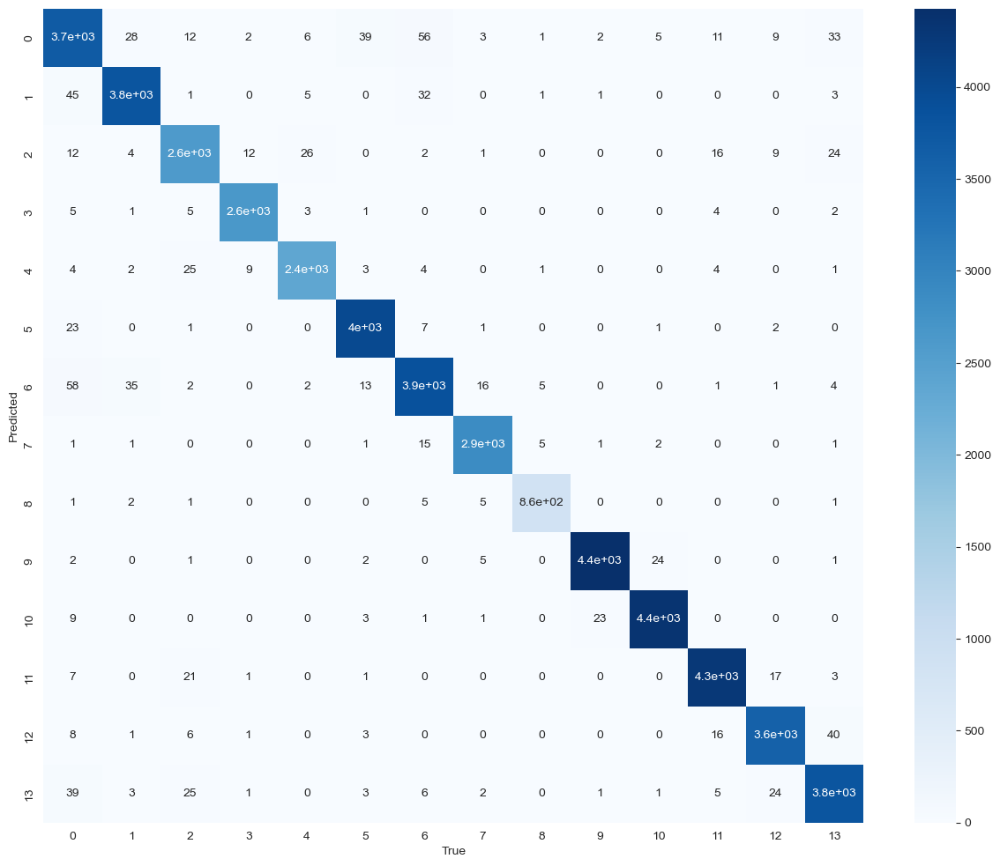

In [54]:
cm = confusion_matrix(y_test, y_predictions, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13])
plt.figure(figsize=(15,12))
sns.heatmap(cm, cmap="Blues", annot = True)
plt.xlabel('True')
plt.ylabel('Predicted')

In [55]:
print("Accuracy Score: {:.2f}".format(accuracy_score(y_test, y_predictions)))
print("F1 Score: {:.2f}".format(f1_score(y_test, y_predictions, average='macro')))

Accuracy Score: 0.98
F1 Score: 0.98


the following chunks of code serve as a demonastration of how fast the models learn as a function of the amount of data.

In [56]:
steps = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
clf2 = LogisticRegression()
vectorizer2 = CountVectorizer()

precisions = []
f1s = []

In [57]:
for i in steps:
  df = data_train.groupby('label').apply(lambda x: x.sample(frac=i)).reset_index(drop=True)
  y = df['label'].values
  X = df['content'].values
  X_te = data_test['content'].values
  y_te = data_test['label'].values
  vectorizer2.fit(X)
  X = vectorizer2.transform(X)
  X_te = vectorizer2.transform(X_te)
  clf2.fit(X, y)
  y_pred = clf2.predict(X_te)
  precisions.append(accuracy_score(y_te, y_pred))
  f1s.append(f1_score(y_test, y_pred, average='macro'))

/Users/luisquinonespr/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/luisquinonespr/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mo

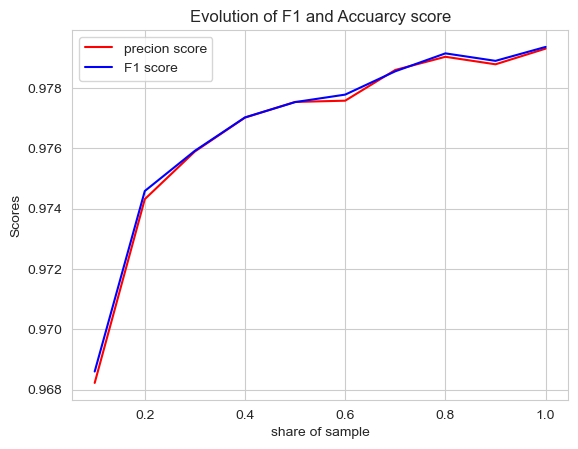

In [58]:
plt.plot(steps, precisions, 'r', label='precion score')
plt.plot(steps, f1s, 'b', label='F1 score')

# set the title and labels for the plot
plt.title('Evolution of F1 and Accuarcy score')
plt.xlabel('share of sample')
plt.ylabel('Scores')

# add a legend to the plot
plt.legend()

# display the plot
plt.show()

Using the Lime Text Explainer might help to understand how the model classifies the texts. However, it might not be scaleable.

In [68]:
c = make_pipeline(vectorizer, clf)

In [69]:
explainer = LimeTextExplainer(class_names=class_names)

exp = explainer.explain_instance(data_train['content'][315567], 
                                 classifier_fn=c.predict_proba,
                                 top_labels=3,
                                 num_features=10)

exp.show_in_notebook()

### Bias Detection
We now feed the model some words/sentences to see potetial biases.

In [70]:
# define sentitive works that I will then feed into lime
sentence1 = 'man boy european caucasian caribbean'
sentence2 = 'woman girl female bangladeshi gypsy'
sentence3 = 'He is balck pakistani european'
sentence4 = 'african indian asian arab'

In [71]:
bias1 = explainer.explain_instance(sentence1, 
                                 classifier_fn=c.predict_proba,
                                 top_labels=3,
                                 num_features=10)

bias1.show_in_notebook()

In [72]:
bias2 = explainer.explain_instance(sentence2, 
                                 classifier_fn=c.predict_proba,
                                 top_labels=3,
                                 num_features=10)

bias2.show_in_notebook()

In [73]:
bias3 = explainer.explain_instance(sentence3, 
                                 classifier_fn=c.predict_proba,
                                 top_labels=3,
                                 num_features=10)

bias3.show_in_notebook()

In [74]:
bias4 = explainer.explain_instance(sentence4, 
                                 classifier_fn=c.predict_proba,
                                 top_labels=3,
                                 num_features=10)

bias4.show_in_notebook()

In the instance bias3 we find a gender bias. Namely, the word he is assoiciated with Office Holders, Artists, and , which may suggest a gender bias. Next, we are investigating more thoroughly if the issue with male  

In [75]:
office = data_train[data_train['label']==4]
office.head(5)

,label,title,content
105969,4.0,Jack Masters,John Gerald (Jack) Masters (born September 27...
105970,4.0,Bhalchandra Yadava,Bhalchandra Yadava (born 1 July 1958) is an I...
105971,4.0,T.W. Shannon,Tahrohon Wayne Shannon (born February 24 1978...
105972,4.0,Jim Ananich,James Ananich or Jim Ananich is a politician ...
105973,4.0,Jim Scheer,Jim Scheer (born September 19 1953 in Norfolk...


In [76]:
office['FirstName'] = office['title'].str.split().str[0]
office.head(5)

/var/folders/hj/n94x31sj08bdmgwjs6ybxbf40000gn/T/ipykernel_28853/1204143397.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  office['FirstName'] = office['title'].str.split().str[0]


,label,title,content,FirstName
105969,4.0,Jack Masters,John Gerald (Jack) Masters (born September 27...,Jack
105970,4.0,Bhalchandra Yadava,Bhalchandra Yadava (born 1 July 1958) is an I...,Bhalchandra
105971,4.0,T.W. Shannon,Tahrohon Wayne Shannon (born February 24 1978...,T.W.
105972,4.0,Jim Ananich,James Ananich or Jim Ananich is a politician ...,Jim
105973,4.0,Jim Scheer,Jim Scheer (born September 19 1953 in Norfolk...,Jim


To classify the office holders into male and female I use a data frame with genarl names and classification([Source](https://github.com/Jcharis/Python-Machine-Learning/tree/master/Gender%20Classification%20With%20%20Machine%20Learning)).

In [77]:
gender_names = pd.read_csv('data/csv/universalnames_dataset.csv')
gender_names.head(5)

,Unnamed: 0,name,sex
0,0,Abebe,M
1,1,Abebi,F
2,2,Abel,M
3,3,Abena,F
4,4,Abeni,F


In [78]:
gender_names = gender_names[(gender_names['sex']=='M') | (gender_names['sex']=='F')]
gender_names['sex'] = gender_names['sex'].apply(lambda x: 1 if x=='M' else 0)
print(gender_names['sex'].mean())
gender_names.head(5)

0.3653439920473843


,Unnamed: 0,name,sex
0,0,Abebe,1
1,1,Abebi,0
2,2,Abel,1
3,3,Abena,0
4,4,Abeni,0


In [79]:
X_name = gender_names['name'].values
y_name = gender_names['sex'].values
X_name_test = office['FirstName'].values

In [80]:
from sklearn.naive_bayes import MultinomialNB
name = MultinomialNB()
cv = CountVectorizer()
cv.fit(X_name)
X_name = cv.transform(X_name)

In [81]:
name.fit(X_name, y_name)

MultinomialNB()

In [82]:
X_name_test = cv.transform(X_name_test)

sex_prediction = name.predict(X_name_test)
sex_prediction[0:5]

array([1, 0, 0, 1, 1])

In [83]:
office['sex'] = sex_prediction
office['sex'].mean()

/var/folders/hj/n94x31sj08bdmgwjs6ybxbf40000gn/T/ipykernel_28853/3700727031.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  office['sex'] = sex_prediction


0.5477916941331575

The number of mean is slightly more than women in the data set. However, there is reason to believe that this number is underestimated. First the names data on which the Naive Bayesian Classifier is trained is skewed towards female names (~55%). Hence, some untradional names like T.W. Shannon are falsely classified as women. 

# Recurrent neural networks (RNN)

### Functions and global vars definition

In [84]:
DEVELOPING = False
MAX_LENGTH = 80
model_name = "RNN_model"

dest_path="data/models/RNN_outputs"
checkpoint_path_best = os.path.join(dest_path,model_name + "_best.hdf5")
checkpoint_path_last = os.path.join(dest_path,model_name + "_last.hdf5")
metrics_list = ["Accuracy", "Precision", "Recall"]

classes =["Company","EducationalInstitution","Artist",
          "Athlete","OfficeHolder","MeanOfTransportation",
          "Building","NaturalPlace","Village","Animal","Plant",
          "Album","Film","WrittenWork"]

In [85]:
nlp = spacy.load("en_core_web_sm")#english tokenizer, tagger, parser and NER
def split_sentences(text):
    aux_sentence = nlp(text)
    return [str(token.lemma_).lower() for token in aux_sentence if not (token.is_stop or \
                                                                token.is_punct or \
                                                                len(token)<3)]

def encoding_data(data_train,data_test,max_length):
    """This function creates the tokenizer, fits it to the data, tokenizes and padds train and test dataframes,
    saves the fitted tokenizer into a file, and finally returns train and test dataframes with text encoded as well as 
    the labels one hot encoded and the word_index dictionary"""
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(data_train["preprocessed_content"])

    # word_index is a dictionary contains indeces for the words like {'for': 8, 'is': 9, 'me': 10, ...}
    word_index = tokenizer.word_index

    # train_sequences is vectors where each vector represents a sentence
    train_sequences = tokenizer.texts_to_sequences(data_train["preprocessed_content"])
    test_sequences = tokenizer.texts_to_sequences(data_test["preprocessed_content"])

    train_sequences = pad_sequences(train_sequences, maxlen=max_length, padding="pre")
    test_sequences = pad_sequences(test_sequences, maxlen=max_length, padding="pre")

    # Convert our labels into one-hot encoded
    onehot_encoder = OneHotEncoder(sparse=False)
    onehot_encoder.fit(np.array(data_train["label"]).reshape(-1, 1))

    train_labels = onehot_encoder.transform(np.array(data_train["label"]).reshape(-1, 1))
    test_labels = onehot_encoder.transform(np.array(data_test["label"]).reshape(-1, 1))


    # saving
    with open('data/tokenizers_embedders/tokenizer.pickle', 'wb') as handle:
        pickle.dump(tokenizer, handle, protocol=pickle.HIGHEST_PROTOCOL)


    return train_sequences, test_sequences, train_labels, test_labels, word_index

def embeddingWights(w2v, word_index, max_num_words=500000):
  
  all_embs = np.stack(w2v.wv.vectors)
  emb_mean,emb_std = all_embs.mean(), all_embs.std()

  num_words = min(max_num_words, len(word_index))+1

  embedding_dim=len(w2v.wv['software'])

  embedding_wights = np.random.normal(emb_mean, emb_std, (num_words, embedding_dim))

  for word, i in word_index.items():
    if i >= max_num_words:
        break

    if word in w2v.wv:
        embedding_vector = w2v.wv[word]
        embedding_wights[i] = embedding_vector
    
  return embedding_wights, num_words

def build_RNN_model(input_size, num_words, output_dim, embedding_wights,metrics_list):

    model = Sequential()
    model.add(Embedding(input_dim=num_words, output_dim=output_dim, trainable=True, input_length=input_size, weights=[embedding_wights]))
    model.add(BatchNormalization())
    model.add(Bidirectional(LSTM(256, return_sequences=True, recurrent_dropout=0.2, dropout=0.2), 'concat'))
    model.add(Dropout(0.4))
    model.add(LSTM(64, return_sequences=True, recurrent_dropout=0.2, dropout=0.2))
    model.add(Dropout(0.4))
    model.add(LSTM(32, return_sequences=False, recurrent_dropout=0.2, dropout=0.2))
    model.add(Dropout(0.2))
    model.add(Dense(32, activation='sigmoid'))
    model.add(Dropout(0.2))
    model.add(Dense(14, activation='softmax'))
    model.compile(loss ='categorical_crossentropy', optimizer = "adam", metrics = metrics_list)


    return model


Resetting variables for our RNN model.

In [91]:
data_train = pd.read_csv("data/csv/clean_df_train.csv")
data_test = pd.read_csv("data/csv/clean_df_test.csv")

In [6]:
#subsampling for developing faster
if DEVELOPING:
    data_train = data_train.groupby('label').apply(lambda x: x.sample(frac=0.03)).reset_index(drop=True)
    data_test = data_test.groupby('label').apply(lambda x: x.sample(frac=0.03)).reset_index(drop=True)

## preprocessing

### Analyzing length of each sentence

With a length of input of 80 words we are only not completely getting approximatelly a 5% of the data (train and test)

In [7]:
data_train["words_count"] = data_train.apply(lambda row: len(row["content"].split()), axis = 1)
data_test["words_count"] = data_test.apply(lambda row: len(row["content"].split()), axis = 1)

In [8]:
data_train["words_count"].describe()

count    11573.000000
mean        45.155966
std         24.755010
min          2.000000
25%         24.000000
50%         44.000000
75%         65.000000
max       1175.000000
Name: words_count, dtype: float64

In [9]:
data_test["words_count"].describe()

count    1443.000000
mean       45.778933
std        23.077126
min         6.000000
25%        24.000000
50%        44.000000
75%        67.000000
max       179.000000
Name: words_count, dtype: float64

In [11]:
data_train["preprocessed_content"] = data_train.apply(lambda row: split_sentences(row["content"]), axis = 1)
data_test["preprocessed_content"] = data_test.apply(lambda row: split_sentences(row["content"]), axis = 1)

In [12]:
data_train.head()

,label,title,content,words_count,preprocessed_content
0,0.0,C's Ware,C's Ware is a label of HimeyaSoft Inc. (not t...,77,"[ware, label, himeyasoft, inc., confuse, distr..."
1,0.0,Octapharma,Octapharma AG is the largest privately owned ...,68,"[octapharma, large, privately, own, human, pro..."
2,0.0,Knoll Aircraft Company,Knoll Aircraft Company was an American aircra...,12,"[knoll, aircraft, company, american, aircraft,..."
3,0.0,Middletown Area Transit,Middletown Area Transit popularly known as MA...,73,"[middletown, area, transit, popularly, know, m..."
4,0.0,FABRAP,FABRAP or Finch Alexander Barnes Rothschild a...,32,"[fabrap, finch, alexander, barnes, rothschild,..."


In [13]:
data_test.head()

,label,title,content,words_count,preprocessed_content
0,0,SemBioSys Genetics,SemBioSys Genetics Inc. was a development sta...,46,"[sembiosys, genetics, inc., development, stage..."
1,0,Element Six,Element Six (formerly De Beers Industrial Dia...,57,"[element, beers, industrial, diamond, company,..."
2,0,NBTY,NBTY Inc. formerly known as Nature's Bounty I...,56,"[nbty, inc., know, nature, bounty, inc., ameri..."
3,0,Pinkberry,Pinkberry is a franchise of upscale frozen de...,65,"[pinkberry, franchise, upscale, frozen, desser..."
4,0,Lam Research,Lam Research Corporation is an American corpo...,27,"[lam, research, corporation, american, corpora..."


### Saving preprocessed dataframes to avoid repeating preprocessing

In [ ]:
data_train.to_csv('data/csv/preprocessed_df_train.csv', index=False)
data_test.to_csv('data/csv/preprocessed_df_test.csv', index=False)

## Tokenizer

In [92]:
data_train = pd.read_csv("data/csv/preprocessed_df_train.csv")
data_test = pd.read_csv("data/csv/preprocessed_df_test.csv")

In [20]:
data_train["preprocessed_content"] = data_train.apply(lambda row: ast.literal_eval(row["preprocessed_content"]), axis = 1)
data_test["preprocessed_content"] = data_test.apply(lambda row: ast.literal_eval(row["preprocessed_content"]), axis = 1)

In [21]:
train_sequences, test_sequences, train_labels, test_labels, word_index = encoding_data(data_train, data_test, MAX_LENGTH)

#Saving all information so we dont need to process them again
with open("data/tokenizers_embedders/train_sequences.pickle","wb") as file:
    pickle.dump(train_sequences,file)
with open("data/tokenizers_embedders/test_sequences.pickle","wb") as file:
    pickle.dump(test_sequences,file)
with open("data/tokenizers_embedders/train_labels.pickle","wb") as file:
    pickle.dump(train_labels,file)
with open("data/tokenizers_embedders/test_labels.pickle","wb") as file:
    pickle.dump(test_labels,file)
with open("data/tokenizers_embedders/word_index.pickle","wb") as file:
    pickle.dump(word_index,file)

In [22]:
# loading
with open('data/tokenizers_embedders/tokenizer.pickle', 'rb') as file:
    tokenizer = pickle.load(file)
with open("data/tokenizers_embedders/train_sequences.pickle","rb") as file:
    train_sequences = pickle.load(file)
with open("data/tokenizers_embedders/train_sequences.pickle","rb") as file:
    test_sequences = pickle.load(file)
with open("data/tokenizers_embedders/train_labels.pickle","rb") as file:
    train_labels = pickle.load(file)
with open("data/tokenizers_embedders/test_labels.pickle","rb") as file:
    test_labels = pickle.load(file)
with open("data/tokenizers_embedders/word_index.pickle","rb") as file:
    word_index = pickle.load(file)

# Defnining word embedding

### Creating our own word embedding with Word2vec

+ min_count = int - Ignores all words with total absolute frequency lower than this - (2, 100)
+ window = int - The maximum distance between the current and predicted word within a sentence. E.g. window words on the left and window words on the left of our target - (2, 10)
+ size = int - Dimensionality of the feature vectors. - (50, 300)
+ sample = float - The threshold for configuring which higher-frequency words are randomly downsampled. Highly influencial. - (0, 1e-5)
+ alpha = float - The initial learning rate - (0.01, 0.05)
min_alpha = float - Learning rate will linearly drop to min_alpha as training progresses. To set it: alpha - (min_alpha * epochs) ~ 0.00
+ negative = int - If > 0, negative sampling will be used, the int for negative specifies how many "noise words" should be drown. If set to 0, no negative sampling is used. - (5, 20)
+ workers = int - Use these many worker threads to train the model (=faster training with multicore machines)

In [23]:
#total words in our vocabulary
len(word_index.keys())

416506

In [24]:
data_train

,label,title,content,words_count,preprocessed_content,preprocessing
0,0.0,E. D. Abbott Ltd,Abbott of Farnham E D Abbott Limited was a Br...,40,"[abbott, farnham, abbott, limited, british, co...","[abbott, farnham, abbott, limited, british, co..."
1,0.0,Schwan-Stabilo,Schwan-STABILO is a German maker of pens for ...,32,"[schwan, stabilo, german, maker, pen, write, c...","[schwan, stabilo, german, maker, pen, write, c..."
2,0.0,Marvell Software Solutions Israel,Marvell Software Solutions Israel known as RA...,29,"[marvell, software, solutions, israel, know, r...","[marvell, software, solutions, israel, know, r..."
3,0.0,Bergan Mercy Medical Center,Bergan Mercy Medical Center is a hospital loc...,19,"[bergan, mercy, medical, center, hospital, loc...","[bergan, mercy, medical, center, hospital, loc..."
4,0.0,The Unsigned Guide,The Unsigned Guide is an online contacts dire...,37,"[unsigned, guide, online, contact, directory, ...","[unsigned, guide, online, contact, directory, ..."
...,...,...,...,...,...,...
385744,13.0,Scoliosis (journal),Scoliosis (ISSN 1748-7161) is an open-access ...,60,"[scoliosis, issn, 1748, 7161, open, access, pe...","[scoliosis, issn, 1748, 7161, open, access, pe..."
385745,13.0,Barking in Essex,Barking in Essex is a Black comedy play direc...,34,"[bark, essex, black, comedy, play, direct, har...","[bark, essex, black, comedy, play, direct, har..."
385746,13.0,Science & Spirit,Science & Spirit is a discontinued American b...,66,"[science, spirit, discontinued, american, bimo...","[science, spirit, discontinued, american, bimo..."
385747,13.0,The Blithedale Romance,The Blithedale Romance (1852) is Nathaniel Ha...,27,"[blithedale, romance, 1852, nathaniel, hawthor...","[blithedale, romance, 1852, nathaniel, hawthor..."


In [25]:
w2v_model = Word2Vec(sentences= data_train["preprocessed_content"].to_list(),
                     min_count=3,
                     window=10,
                     vector_size=100,
                     sample=6e-5, 
                     alpha=0.03, 
                     min_alpha=0.0007)

In [29]:
w2v_model.save("data/models/word2vec.model")

In [30]:
#total words in our word embedding ignoring words that appear less than 3 times
len(w2v_model.wv)

124152

In [32]:
embedding_wights, num_words = embeddingWights(w2v_model, word_index, max_num_words=500000)

In [33]:
# testing the word embedding by comparing the weights of the final 
# embedding_wights and w2v_model.wv vector for the word "software", 
# they should be the same so the result should be 0.

(embedding_wights[word_index["school"],:].reshape([100,1])-w2v_model.wv["school"].reshape([100,1])).sum()

0.0

In [35]:
#saving embedding weights
np.save('data/models/embedding_layer_weights.npy', embedding_wights)
np.save('data/models/num_words.npy', num_words)

### Visualizing word embedding

In [48]:
#loading previously trained model
w2v_model = Word2Vec.load("data/models/word2vec.model")

In [49]:
#testing similarities
word = 'software'
print(f"3 words similar to **{word}**")
words = w2v_model.wv.most_similar(word, topn=3)
for word in words:
  print(word)

3 words similar to **software**
('computer', 0.8293694257736206)
('linux', 0.8119499087333679)
('microsoft', 0.8118927478790283)


In [50]:
#testing similarities
word = 'school'
print(f"3 words similar to **{word}**")
words = w2v_model.wv.most_similar(word, topn=3)
for word in words:
  print(word)

3 words similar to **school**
('high', 0.7755335569381714)
('secondary', 0.7312402129173279)
('grade', 0.7299057841300964)


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


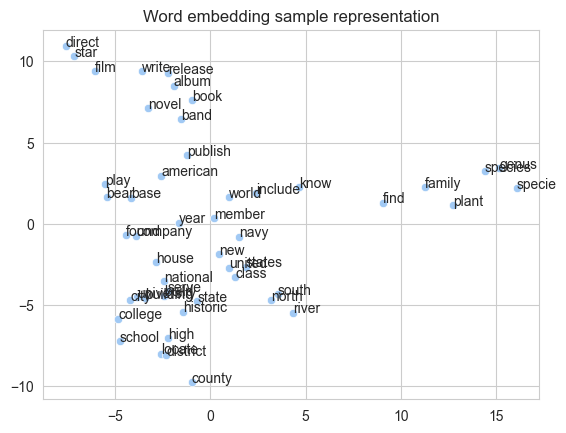

In [74]:
from sklearn.decomposition import PCA

words_to_represent = 50

pca = PCA(n_components=2)
result = pca.fit_transform(w2v_model.wv.vectors[:words_to_represent])
word_embedding_fig = sns.scatterplot(result[:,0],result[:,1])

words = list(w2v_model.wv.key_to_index.keys())[:words_to_represent]

for i in range(words_to_represent):
   word_embedding_fig.annotate(words[i], xy = (result[i, 0], result[i, 1]))

word_embedding_fig.set_title('Word embedding sample representation')

plt.savefig("data/results/figures/word_embedding.png")

# Training

### Data separation

In [68]:
#loading datasets
with open("data/tokenizers_embedders/train_sequences.pickle","rb") as file:
    train_sequences = pickle.load(file)
with open("data/tokenizers_embedders/test_sequences.pickle","rb") as file:
    test_sequences = pickle.load(file)
with open("data/tokenizers_embedders/train_labels.pickle","rb") as file:
    train_labels = pickle.load(file)
with open("data/tokenizers_embedders/test_labels.pickle","rb") as file:
    test_labels = pickle.load(file)

In [10]:
#loading files for training the model
embedding_wights = np.load("data/models/embedding_layer_weights.npy")
num_words = np.load("data/models/num_words.npy")

In [11]:
embedding_wights.shape

(416507, 100)

In [12]:
num_words

array(416507)

In [77]:
train_sequences.shape

(385749, 80)

In [ ]:
train_data, val_data, train_labels, val_labels = train_test_split(train_sequences, 
                                                                  train_labels,
                                                                  test_size = 0.2)
test_data = test_sequences
test_labels = test_labels

In [15]:
#Creation of callbacks

log_dir = dest_path + "/logs/fit/"+ datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', 
                                                mode='min', 
                                                patience = 5, 
                                                verbose=1)

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = log_dir,
                                                        histogram_freq = 1)

cp_callback_best = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path_best,
                                                save_best_only=True,
                                                monitor = "val_loss",
                                                mode = "min",
                                                verbose=1)

cp_callback_last = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_last,
                                                    verbose = 0,
                                                    save_freq = 'epoch')

reduce_lr_callback = ReduceLROnPlateau(monitor='val_loss', patience = 5, mode = "min", verbose = 1, factor = 0.1, min_delta=0.001, min_lr = 0.00001)

callbacks_list = [cp_callback_best, cp_callback_last, es_callback, tensorboard_callback]

In [ ]:
#creating the model
RNN_model = build_RNN_model(MAX_LENGTH, num_words, 100, embedding_wights, metrics_list)
RNN_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 80, 100)           41650700  
                                                                 
 batch_normalization (BatchN  (None, 80, 100)          400       
 ormalization)                                                   
                                                                 
 bidirectional_1 (Bidirectio  (None, 80, 512)          731136    
 nal)                                                            
                                                                 
 dropout_4 (Dropout)         (None, 80, 512)           0         
                                                                 
 lstm_4 (LSTM)               (None, 80, 64)            147712    
                                                                 
 dropout_5 (Dropout)         (None, 80, 64)           

In [ ]:
history = RNN_model.fit(train_data, train_labels, epochs = 50,
          batch_size = 1512, shuffle=True,
          validation_data=[val_data, val_labels],
          callbacks = callbacks_list,
          verbose = 1,
          use_multiprocessing=True
          )

Epoch 1/50
205/205 [==============================] - ETA: 0s - loss: 1.1226 - Accuracy: 0.8502 - precision: 0.9701 - recall: 0.3303
Epoch 00001: val_loss improved from inf to 0.43931, saving model to data\models\tensorflow_outputs\RNN_model_best.hdf5
205/205 [==============================] - 1065s 5s/step - loss: 1.1226 - Accuracy: 0.8502 - precision: 0.9701 - recall: 0.3303 - val_loss: 0.4393 - val_Accuracy: 0.9598 - val_precision: 0.9699 - val_recall: 0.9334
Epoch 2/50
205/205 [==============================] - ETA: 0s - loss: 0.3893 - Accuracy: 0.9606 - precision: 0.9763 - recall: 0.8975
Epoch 00002: val_loss improved from 0.43931 to 0.18296, saving model to data\models\tensorflow_outputs\RNN_model_best.hdf5
205/205 [==============================] - 967s 5s/step - loss: 0.3893 - Accuracy: 0.9606 - precision: 0.9763 - recall: 0.8975 - val_loss: 0.1830 - val_Accuracy: 0.9753 - val_precision: 0.9798 - val_recall: 0.9717
Epoch 3/50
205/205 [==============================] - ETA: 0s -

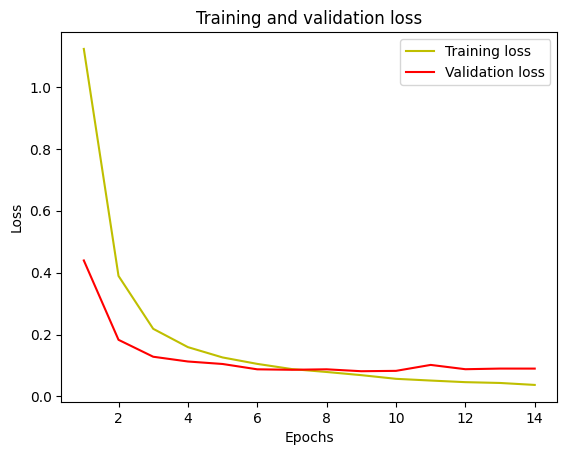

In [ ]:

loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

### Learning curve

In [4]:
data_train = pd.read_csv("data/csv/preprocessed_df_train.csv")


In [5]:
subsample_indices = list(map(lambda i: i[1] ,data_train.groupby('label').apply(lambda x: x.sample(n = int(14/14))).index))


In [19]:
#loading datasets
with open("data/tokenizers_embedders/train_sequences.pickle","rb") as file:
    train_sequences = pickle.load(file)
with open("data/tokenizers_embedders/test_sequences.pickle","rb") as file:
    test_sequences = pickle.load(file)
with open("data/tokenizers_embedders/train_labels.pickle","rb") as file:
    train_lab = pickle.load(file)
with open("data/tokenizers_embedders/test_labels.pickle","rb") as file:
    test_labels = pickle.load(file)

#loading embedding
embedding_wights = np.load("data/models/embedding_layer_weights.npy")
num_words = np.load("data/models/num_words.npy")


In [60]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

ns = [56,560,5600,10000]
samples = 2
epochs = 2


precision_means = []
recall_means = []
precision_std = []
recall_std = []

accuracy_means = []
F1_means = []
accuracy_std = []
F1_std = []

for n in ns:
      accuracies = []
      precisions = []
      recalls = []
      F1scores = []
      for i in range(samples):
         RNN_model = build_RNN_model(MAX_LENGTH, num_words, 100, embedding_wights, metrics_list)

         subsample_indices = list(map(lambda i: i[1] ,data_train.groupby('label').apply(lambda x: x.sample(int(n/14))).index))
         train_data, val_data, train_labels, val_labels = train_test_split(train_sequences[subsample_indices], 
                                                                  train_lab[subsample_indices],
                                                                  test_size = 0.2,
                                                                  random_state=10)
         if n < 1000:
            batch_size = 12
         else:
            batch_size = 864
         RNN_model.fit(train_data,train_labels , epochs = epochs,
                  batch_size = batch_size, shuffle=True,
                  validation_data=[val_data, val_labels],
                  verbose = 1,
                  use_multiprocessing=True
                  )
         
         preds = RNN_model.predict(test_sequences, batch_size = 800)

         accuracy = accuracy_score(np.argmax(test_labels, axis = 1), np.argmax(preds, axis = 1))
         precision = precision_score(np.argmax(test_labels, axis = 1), np.argmax(preds, axis = 1), average="micro")
         recall = recall_score(np.argmax(test_labels, axis = 1), np.argmax(preds, axis = 1), average="micro")
         f1score = f1_score(np.argmax(test_labels, axis = 1), np.argmax(preds, axis = 1), average="micro")

         accuracies.append(accuracy)
         precisions.append(precision)
         recalls.append(accuracy)
         F1scores.append(2*(precision*recall)/(precision+recall+0.00001))

          
      precision_means.append(np.mean(precisions))
      recall_means.append(np.mean(recalls))
      precision_std.append(np.std(precisions))
      recall_std.append(np.std(recalls))
      accuracy_means.append(np.mean(precisions))
      F1_means.append(np.mean(recalls))
      accuracy_std.append(np.mean(precisions))
      F1_std.append(np.mean(recalls))


Epoch 1/2
4/4 [==============================] - 42s 3s/step - loss: 2.7669 - Accuracy: 0.0909 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 2.8819 - val_Accuracy: 0.0000e+00 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/2
61/61 [==============================] - 120s 2s/step
Epoch 1/2
4/4 [==============================] - 32s 3s/step - loss: 2.9406 - Accuracy: 0.0682 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 2.9557 - val_Accuracy: 0.0000e+00 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/2
61/61 [==============================] - 90s 1s/step
Epoch 1/2
38/38 [==============================] - 70s 1s/step - loss: 2.6743 - Accuracy: 0.1183 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 2.4178 - val_Accuracy: 0.2946 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/2
61/61 [==============================] - 69s 1s/step
Epoch 1/2
38/38 [==============================] - 46s 928ms/step - loss: 2.6781 - Accuracy: 0.

In [61]:
precision_means

[0.08358792110896357,
 0.5524242991042667,
 0.18126649624872704,
 0.6063969075378763]

### Evaluation

In [7]:
with open("data/tokenizers_embedders/test_sequences.pickle","rb") as file:
    test_sequences = pickle.load(file)
with open("data/tokenizers_embedders/test_labels.pickle","rb") as file:
    test_labels = pickle.load(file)

with open("data/tokenizers_embedders/test_labels.pickle","rb") as file:
    test_labels = pickle.load(file)

#loading embedding
embedding_wights = np.load("data/models/embedding_layer_weights.npy")
num_words = np.load("data/models/num_words.npy")

#creating the model structure
RNN_model = build_RNN_model(MAX_LENGTH, num_words, 100, embedding_wights, metrics_list)

#loading weights
checkpoint_path = checkpoint_path_best
RNN_model.load_weights(checkpoint_path)

In [8]:
results = RNN_model.evaluate(test_sequences, test_labels, batch_size = 1512)
results

32/32 [==============================] - 86s 3s/step - loss: 0.0821 - Accuracy: 0.9839 - precision: 0.9854 - recall: 0.9831


[0.08208899199962616,
 0.9839349985122681,
 0.9853559732437134,
 0.9830828905105591]

In [9]:
F1score = 2*(results[2]*results[3])/(results[2]+results[3])
F1score

0.9842181194398524

In [10]:
print("Precision over test set: " + str(results[2]))
print("Recall over test set: " + str(results[3]))
print("Accuracy over test set: " + str(results[1]))
print("F1 over test set: " + str(F1score))

Precision over test set: 0.9853559732437134
Recall over test set: 0.9830828905105591
Accuracy over test set: 0.9839349985122681
F1 over test set: 0.9842181194398524


In [11]:
#creating a matrix with results for each class
test_labels.shape

(48117, 14)

In [12]:
results_matrix = np.zeros((4,14))

In [13]:
for i in range(14):
    y_test_class = test_labels[test_labels[:,i] == 1]
    x_test_class = test_sequences[test_labels[:,i] == 1]
    results = RNN_model.evaluate(x_test_class, y_test_class, batch_size = 1512)

    results_matrix[0,i] = results[1]#accuracy
    results_matrix[1,i] = results[2]#precision
    results_matrix[2,i] = results[3]#recall
    results_matrix[3,i] = 2*(results[2]*results[3])/(results[2]+results[3])#F1    

3/3 [==============================] - 6s 2s/step - loss: 0.0935 - Accuracy: 0.9816 - precision: 0.9838 - recall: 0.9811


In [16]:
results_matrix

array([[0.95976424, 0.98171043, 0.97338265, 0.99212891, 0.98146623,
        0.98737311, 0.97726703, 0.9913255 , 0.9908362 , 0.99080926,
        0.99681091, 0.98981953, 0.98330599, 0.98157626],
       [0.96186548, 0.98397934, 0.97553742, 0.99324578, 0.98388427,
        0.98834902, 0.97843528, 0.99201387, 0.99197251, 0.99125367,
        0.9970367 , 0.99118537, 0.98518109, 0.98383373],
       [0.95668888, 0.98093766, 0.97301292, 0.99212891, 0.9806425 ,
        0.98712552, 0.97476894, 0.9913255 , 0.9908362 , 0.99080926,
        0.99635535, 0.98866266, 0.98248494, 0.9810645 ],
       [0.9592702 , 0.98245615, 0.97427354, 0.99268703, 0.98226071,
        0.98773689, 0.97659867, 0.99166957, 0.99140403, 0.99103142,
        0.99669591, 0.98992241, 0.98383117, 0.98244716]])

In [15]:
results_matrix.shape

(4, 14)

In [74]:
results_df = pd.DataFrame(results_matrix, columns = classes)
results_df.index = ["Accuracy", "Precision", "Recall", "F1score"]
results_df["global"] = results_df.apply(lambda row: row[classes].mean(), axis = 1)
results_df

,Company,EducationalInstitution,Artist,Athlete,OfficeHolder,MeanOfTransportation,Building,NaturalPlace,Village,Animal,Plant,Album,Film,WrittenWork,global
Accuracy,0.959764,0.981710,0.973383,0.992129,0.981466,0.987373,0.977267,0.991325,0.990836,0.990809,0.996811,0.989820,0.983306,0.981576,0.984113
Precision,0.961865,0.983979,0.975537,0.993246,0.983884,0.988349,0.978435,0.992014,0.991973,0.991254,0.997037,0.991185,0.985181,0.983834,0.985555
Recall,0.956689,0.980938,0.973013,0.992129,0.980642,0.987126,0.974769,0.991325,0.990836,0.990809,0.996355,0.988663,0.982485,0.981064,0.983346
F1score,0.959270,0.982456,0.974274,0.992687,0.982261,0.987737,0.976599,0.991670,0.991404,0.991031,0.996696,0.989922,0.983831,0.982447,0.984449


In [47]:
results_df.to_csv("data/results/models_results/RNN_metrics_results.csv")

# Error analysis

In [87]:
#loading datasets
with open("data/tokenizers_embedders/test_sequences.pickle","rb") as file:
    test_sequences = pickle.load(file)
with open("data/tokenizers_embedders/test_labels.pickle","rb") as file:
    test_labels = pickle.load(file)

#loading embedding
embedding_wights = np.load("data/models/embedding_layer_weights.npy")
num_words = np.load("data/models/num_words.npy")

#creating the model structure
RNN_model = build_RNN_model(MAX_LENGTH, num_words, 100, embedding_wights, metrics_list)

#loading weights
checkpoint_path = checkpoint_path_best
RNN_model.load_weights(checkpoint_path)

In [88]:
test_dataset_errors = pd.read_csv("data/csv/preprocessed_df_test.csv")

In [90]:
test_pred = RNN_model.predict(test_sequences, batch_size = 1024)

47/47 [==============================] - 72s 2s/step


In [93]:
max_vals = []
for vector in test_pred:

    max_val = np.max(vector)
    max_index = np.where(vector == max_val)[0][0]
    max_vals.append(max_index)
    
test_dataset_errors["pred"] = max_vals

In [106]:
test_dataset_errors["correct_pred"] = test_dataset_errors.apply(lambda row: True if row["pred"]==row["label"] else False, axis = 1)

In [111]:
test_dataset_errors.to_csv("data/results/models_results/RNN_errors_analysis.csv")

In [108]:
test_dataset_errors[test_dataset_errors["correct_pred"] == False]["label"].value_counts()

0     157
6      91
2      72
13     72
1      71
12     61
5      51
4      45
11     44
9      41
7      25
3      21
10     14
8       8
Name: label, dtype: int64

# Bias analysis

In [20]:
#loading embedding
embedding_wights = np.load("data/models/embedding_layer_weights.npy")
num_words = np.load("data/models/num_words.npy")

#creating the model structure
RNN_model = build_RNN_model(MAX_LENGTH, num_words, 100, embedding_wights, metrics_list)

#loading weights
checkpoint_path = checkpoint_path_best
RNN_model.load_weights(checkpoint_path)

# loading tokenizer
with open('data/tokenizers_embedders/tokenizer.pickle', 'rb') as file:
    tokenizer = pickle.load(file)

In [10]:
#loading word embedder
w2v_model = Word2Vec.load("data/models/word2vec.model")

In [75]:
words = ["man","boy","male","woman","girl","female",
          "european","caucasian","african","asian" ,
          "indian","pakistani","bangladeshi","chinese",
          "caribbean","gypsy","arab"]

token_seq = []


for word in words:
    token = w2v_model.wv.key_to_index[word]
    token_seq.append([token])
    padded_sequences = pad_sequences(token_seq, maxlen=MAX_LENGTH, padding="pre")

padded_sequences

array([[   0,    0,    0, ...,    0,    0,  243],
       [   0,    0,    0, ...,    0,    0,  552],
       [   0,    0,    0, ...,    0,    0, 1007],
       ...,
       [   0,    0,    0, ...,    0,    0, 1808],
       [   0,    0,    0, ...,    0,    0, 8733],
       [   0,    0,    0, ...,    0,    0, 2418]], dtype=int32)

In [76]:
bias_results = RNN_model.predict(padded_sequences)

1/1 [==============================] - 1s 1s/step


In [80]:
bias_results = pd.DataFrame(bias_results, columns=classes)
bias_results.index = words
bias_results

,Company,EducationalInstitution,Artist,Athlete,OfficeHolder,MeanOfTransportation,Building,NaturalPlace,Village,Animal,Plant,Album,Film,WrittenWork
man,0.185187,0.064930,0.045896,0.051979,0.058277,0.031698,0.077652,0.004840,0.038555,0.021730,0.009871,0.073602,0.254367,0.081415
boy,0.000746,0.003273,0.000709,0.012014,0.001758,0.000905,0.001762,0.000071,0.001058,0.964592,0.006997,0.004078,0.001851,0.000185
male,0.145366,0.085077,0.046972,0.039603,0.075645,0.050949,0.087699,0.061754,0.134053,0.032464,0.060315,0.092336,0.048591,0.039175
woman,0.131825,0.025133,0.039009,0.094813,0.198807,0.059704,0.053253,0.018026,0.055779,0.039579,0.054535,0.133210,0.063404,0.032923
girl,0.027889,0.015640,0.010343,0.001158,0.044820,0.033690,0.720597,0.026533,0.020421,0.024470,0.032099,0.017220,0.011974,0.013145
female,0.084327,0.196300,0.037152,0.144879,0.063758,0.041069,0.060617,0.004719,0.077267,0.092173,0.034930,0.054721,0.073297,0.034791
european,0.113899,0.018514,0.064077,0.106935,0.277660,0.050301,0.051948,0.018267,0.040633,0.034221,0.056346,0.088227,0.046717,0.032254
caucasian,0.105238,0.029547,0.035476,0.080670,0.187822,0.046349,0.063021,0.016218,0.080434,0.044574,0.051669,0.156524,0.065465,0.036995
african,0.044473,0.026737,0.012612,0.040498,0.091780,0.018946,0.026748,0.017999,0.372020,0.014004,0.043554,0.217669,0.045314,0.027646
asian,0.186272,0.025032,0.032311,0.042173,0.132493,0.039383,0.058524,0.086859,0.066474,0.027110,0.068450,0.174089,0.032838,0.027992


In [84]:
bias_results.to_csv("data/results/models_results/RNN_biass_analysis.csv")


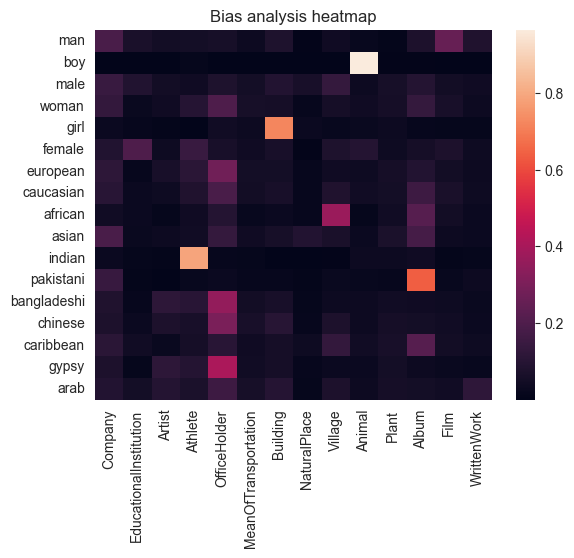

In [86]:
sns.heatmap(bias_results)
plt.title('Bias analysis heatmap')
plt.savefig("images/biass_heatmap.png")

# BERT development

In [6]:
DEVELOPING = True
MAX_LENGTH = 80

Reinitiating our variables for our BERT model.

In [7]:
data_train = pd.read_csv("data/csv/clean_df_train.csv")
data_test = pd.read_csv("data/csv/clean_df_test.csv")

In [8]:
#subsampling for developing faster
if DEVELOPING:
    data_train = data_train.groupby('label').apply(lambda x: x.sample(frac=0.1)).reset_index(drop=True)

In [9]:
data_train["words_count"] = data_train.apply(lambda row: len(row["content"].split()), axis = 1)
data_test["words_count"] = data_test.apply(lambda row: len(row["content"].split()), axis = 1)

In [10]:
data_train[data_train["words_count"] > 80]

,label,title,content,words_count
111,0.0,3CG Records,3CG Records is an independent record label st...,82
168,0.0,Gearhead Records,Gearhead Records is an independent record lab...,83
173,0.0,Union Label Group,Union Label Group is a record label based in ...,82
199,0.0,Hindustan Motors,Hindustan Motors is an Indian automotive manu...,86
203,0.0,Rinnai,Rinnai Corporation is a company based in Nago...,84
...,...,...,...,...
38415,13.0,The Rear Column,The Rear Column is a play by Simon Gray set i...,82
38422,13.0,The Summoner,The Summoner is a 2007 fantasy novel by Gail ...,93
38423,13.0,Consider Phlebas,Consider Phlebas first published in 1987 is a...,83
38510,13.0,I Loved Tiberius,Jeg elsket Tiberius is a 1959 romance novel b...,86


In [11]:
data_test[data_test["words_count"] > 80]

,label,title,content,words_count
74,0,Haudenosaunee Development Institute,Haudenosaunee Development Institute is the fo...,124
86,0,Transurban,Transurban manages and develops urban toll ro...,83
93,0,American Society of Plant Taxonomists,The American Society of Plant Taxonomists (AS...,84
105,0,Town & Country Surf Designs,Town & Country Surf Designs (also known as T&...,81
116,0,New Media Strategies,New Media Strategies (NMS) is a social media ...,82
...,...,...,...,...
48059,13,Rubicon: The Last Years of the Roman Republic,Rubicon: The Triumph and Tragedy of the Roman...,85
48085,13,The Simpsons and Philosophy: The D'oh! of Homer,The Simpsons and Philosophy: The D'oh! of Hom...,82
48093,13,The Saint in Miami,The Saint in Miami is the title of a mystery ...,86
48094,13,The Last Voyage of Somebody the Sailor,The Last Voyage of Somebody the Sailor is a n...,85


In [12]:
data_train

,label,title,content,words_count
0,0.0,Astra Airlines,Astra Airlines is an airline based in Thessal...,25
1,0.0,Veda (company),Veda is the largest credit reference agency i...,64
2,0.0,Smith Travel Research,STR (Smith Travel Research Inc.) is an Americ...,56
3,0.0,Total Sports Entertainment,TSE Services (Total Sports Entertainment Tota...,52
4,0.0,Beter Bed,Beter Bed N.V. is a Dutch holding company. Th...,58
...,...,...,...,...
38570,13.0,The Piano Tuner,The Piano Tuner is a historical novel by Dani...,70
38571,13.0,Timeline of science fiction,This is a timeline of major events related to...,20
38572,13.0,The Seven Sisters of India (book),The Seven Sisters of India: Tribal Worlds Bet...,61
38573,13.0,The Year's Best Fantasy Stories: 2,The Year's Best Fantasy Stories: 2 is a 1976 ...,17


In [13]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [14]:
possible_labels = data_train.label.unique()

label_dict = {}
for index, possible_label in enumerate(possible_labels):
    label_dict[possible_label] = index
label_dict

{0.0: 0,
 1.0: 1,
 2.0: 2,
 3.0: 3,
 4.0: 4,
 5.0: 5,
 6.0: 6,
 7.0: 7,
 8.0: 8,
 9.0: 9,
 10.0: 10,
 11.0: 11,
 12.0: 12,
 13.0: 13}

In [15]:
data_train['label'] = data_train.label.replace(label_dict)
data_test['label'] = data_test.label.replace(label_dict)


In [16]:
label_names = ["Company", "EducationalInstitution", "Artist", "Athlete", "OfficeHolder", "MeanOfTransportation", "Building", "NaturalPlace",
               "Village","Animal", "Plant", "Album", "Film", "WrittenWork" ]

In [17]:
data_train

,label,title,content,words_count
0,0.0,Astra Airlines,Astra Airlines is an airline based in Thessal...,25
1,0.0,Veda (company),Veda is the largest credit reference agency i...,64
2,0.0,Smith Travel Research,STR (Smith Travel Research Inc.) is an Americ...,56
3,0.0,Total Sports Entertainment,TSE Services (Total Sports Entertainment Tota...,52
4,0.0,Beter Bed,Beter Bed N.V. is a Dutch holding company. Th...,58
...,...,...,...,...
38570,13.0,The Piano Tuner,The Piano Tuner is a historical novel by Dani...,70
38571,13.0,Timeline of science fiction,This is a timeline of major events related to...,20
38572,13.0,The Seven Sisters of India (book),The Seven Sisters of India: Tribal Worlds Bet...,61
38573,13.0,The Year's Best Fantasy Stories: 2,The Year's Best Fantasy Stories: 2 is a 1976 ...,17


In [18]:
y_train = data_train['label']
data_train = data_train.drop(columns='label')
X_train, X_val, y_train, y_val = train_test_split(data_train,y_train, test_size=0.2, random_state=4)

In [19]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased', 
                                          do_lower_case=True)

In [21]:
encoded_data_train = tokenizer.batch_encode_plus(
    X_train.content.values, 
    add_special_tokens=True, 
    return_attention_mask=True, 
    padding=True, 
    return_tensors='pt'
)

encoded_data_val = tokenizer.batch_encode_plus( 
    X_val.content.values, 
    add_special_tokens=True, 
    return_attention_mask=True, 
    padding=True, 
    return_tensors='pt'
)

encoded_data_test = tokenizer.batch_encode_plus( 
    data_test.content.values, 
    add_special_tokens=True, 
    return_attention_mask=True, 
    padding=True, 
    return_tensors='pt'
)


input_ids_train = encoded_data_train['input_ids']
attention_masks_train = encoded_data_train['attention_mask']
labels_train = torch.tensor(y_train.values)

input_ids_val = encoded_data_val['input_ids']
attention_masks_val = encoded_data_val['attention_mask']
labels_val = torch.tensor(y_val.values)

input_ids_test = encoded_data_test['input_ids']
attention_masks_test = encoded_data_test['attention_mask']
labels_test = torch.tensor(data_test.label.values)

In [22]:
tensor_train = TensorDataset(input_ids_train, attention_masks_train, labels_train)
tensor_test = TensorDataset(input_ids_test, attention_masks_test, labels_test)
tensor_val = TensorDataset(input_ids_val, attention_masks_val, labels_val)

In [23]:
len(tensor_train), len(tensor_test), len(tensor_val)

(30860, 48117, 7715)

In [24]:
model = BertForSequenceClassification.from_pretrained("bert-base-uncased",
                                                      num_labels=len(label_dict),
                                                      output_attentions=False,
                                                      output_hidden_states=False)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.decoder.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at

In [25]:
from torch.utils.data import DataLoader, RandomSampler, SequentialSampler

batch_size = 16

dataloader_train = DataLoader(tensor_train, 
                              sampler=RandomSampler(tensor_train), 
                              batch_size=batch_size)

dataloader_test = DataLoader(tensor_test, 
                                   sampler=SequentialSampler(tensor_test), 
                                   batch_size=batch_size)

dataloader_val = DataLoader(tensor_val, 
                                   sampler=SequentialSampler(tensor_val), 
                                   batch_size=batch_size)

In [26]:
from transformers import get_linear_schedule_with_warmup
from torch.optim import AdamW

optimizer = AdamW(model.parameters(),
                  lr=1e-5, 
                  eps=1e-8)

In [27]:
epochs = 2

scheduler = get_linear_schedule_with_warmup(optimizer, 
                                            num_warmup_steps=0,
                                            num_training_steps=len(dataloader_train)*epochs)

In [28]:
def f1_score_func(preds, labels):
    preds_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = np.argmax(labels, axis=1).flatten()
    return f1_score(labels_flat, preds_flat, average='weighted')

def precision_score_func(preds, labels):
    preds_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = np.argmax(labels, axis=1).flatten()
    return precision_score(labels_flat, preds_flat, average='weighted')

def recall_score_func(preds, labels):
    preds_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = np.argmax(labels, axis=1).flatten()
    return recall_score(labels_flat, preds_flat, average='weighted')

def accuracy_per_class(preds, labels):
    label_dict_inverse = {v: k for k, v in label_dict.items()}
    
    preds_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = np.argmax(labels, axis=1).flatten()

    for label in np.unique(labels_flat):
        y_preds = preds_flat[labels_flat==label]
        y_true = labels_flat[labels_flat==label]
        print(f'Class: {label_dict_inverse[label]}')
        print(f'Accuracy: {len(y_preds[y_preds==label])}/{len(y_true)}\n')

In [29]:
import random

seed_val = 17
random.seed(seed_val)
np.random.seed(seed_val)
torch.manual_seed(seed_val)

In [30]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

print(device)

cpu


In [31]:
def one_hot_encoding(labels, num_classes):
    batch_size = labels.size(0)
    one_hot_labels = torch.zeros(batch_size, num_classes).to(device)
    one_hot_labels.scatter_(1, labels.unsqueeze(1).to(torch.int64), 1.0)
    return one_hot_labels
num_classes = 14

In [32]:
def evaluate(dataloader_val):

    model.eval()
    
    loss_val_total = 0
    predictions, true_vals = [], []
    
    for batch in dataloader_val:
        
        batch = tuple(b.to(device) for b in batch)
  
        
        one_hot_labels = one_hot_encoding(batch[2], num_classes)
        
        inputs = {'input_ids':      batch[0],
                  'attention_mask': batch[1],
                  'labels':         one_hot_labels,
                 }

        with torch.no_grad():        
            outputs = model(**inputs)
            
        loss = outputs[0]
        logits = outputs[1]
        loss_val_total += loss.item()

        logits = logits.detach().cpu().numpy()
        label_ids = inputs['labels'].cpu().numpy()
        predictions.append(logits)
        true_vals.append(label_ids)
    
    loss_val_avg = loss_val_total/len(dataloader_val) 
    
    predictions = np.vstack(predictions)
    true_vals = np.vstack(true_vals)
            
    return loss_val_avg, predictions, true_vals


In [ ]:

train_loss_list = []
val_loss_list  = []
val_precisions = []
val_recalls = []
val_F1s = []

for epoch in tqdm(range(1, epochs+1)):
    model.train()
    
    loss_train_total = 0

    progress_bar = tqdm(dataloader_train, desc='Epoch {:1d}'.format(epoch), leave=False, disable=False)
    for batch in progress_bar:

        model.zero_grad()
        batch = tuple(b.to(device) for b in batch)
        one_hot_labels = one_hot_encoding(batch[2], num_classes)
        
        inputs = {'input_ids':      batch[0],
                  'attention_mask': batch[1],
                  'labels':         one_hot_labels,
                 }        

        outputs = model(**inputs)
    
        loss = outputs[0]
        #loss_train_total += loss.item()
        loss.backward()

        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

        optimizer.step()
        scheduler.step()
        progress_bar.set_postfix({'training_loss': '{:.3f}'.format(loss.item()/len(batch))})
        
    #torch.save(model.state_dict(), f'data/results/models_results/finetuned_BERT_epoch_{epoch}.model')
        
    tqdm.write(f'\nEpoch {epoch}')
    
    #loss_train_avg = loss_train_total/len(dataloader_train)     
    loss_train = loss.item()
    train_loss_list.append(loss_train)       
    tqdm.write(f'Training loss: {loss_train}')
    
    val_loss, predictions, true_vals = evaluate(dataloader_val)
    val_loss_list.append(val_loss)
    val_f1 = f1_score_func(predictions, true_vals)
    val_F1s.append(val_f1)
    tqdm.write(f'Validation loss: {val_loss}')
    tqdm.write(f'F1 Score (Weighted): {val_f1}')
    val_precision = precision_score_func(predictions, true_vals)
    val_precisions.append(val_precision)
    tqdm.write(f'Validation loss: {val_loss}')
    tqdm.write(f'Precision Score: {val_precision}')
    val_recall = recall_score_func(predictions, true_vals)
    val_recalls.append(val_recall)
    tqdm.write(f'Validation loss: {val_loss}')
    tqdm.write(f'Recall Score: {val_recall}')

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch 1:   0%|          | 0/1929 [00:00<?, ?it/s]


Epoch 1
Training loss: 0.006258789915591478
Validation loss: 0.010705274039027175
F1 Score (Weighted): 0.9891069129619006
Validation loss: 0.010705274039027175
Precision Score: 0.9891315925819251
Validation loss: 0.010705274039027175
Recall Score: 0.9891121192482177


Epoch 2:   0%|          | 0/1929 [00:00<?, ?it/s]


Epoch 2
Training loss: 0.005922717973589897
Validation loss: 0.010705274039027175
F1 Score (Weighted): 0.9891069129619006
Validation loss: 0.010705274039027175
Precision Score: 0.9891315925819251
Validation loss: 0.010705274039027175
Recall Score: 0.9891121192482177


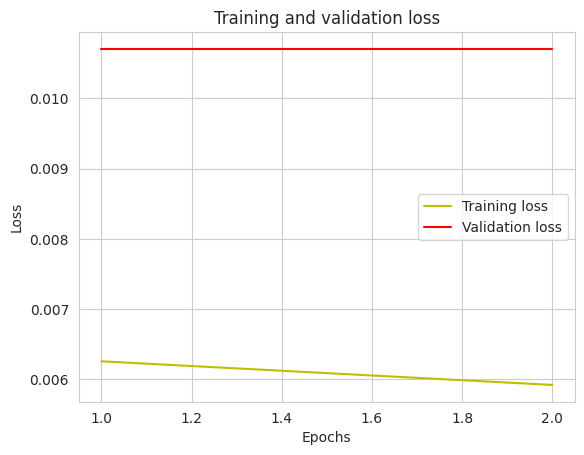

In [ ]:

loss = train_loss_list
val_loss = val_loss_list
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()


In [115]:
model = BertForSequenceClassification.from_pretrained("bert-base-uncased",
                                                      num_labels=len(label_dict),
                                                      output_attentions=False,
                                                      output_hidden_states=False)

model.to(device)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0): BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, element

In [116]:
model.load_state_dict(torch.load('data/results/models_results/finetuned_BERT_epoch_2.model', map_location=torch.device('cuda')))

<All keys matched successfully>

In [117]:
_, predictions, true_vals = evaluate(dataloader_test)


In [121]:
np.save('data/results/models_results/predictions_TEST.npy', predictions)

In [219]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix

def metrics_per_class(preds, labels, label_names):
    preds_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = np.argmax(labels, axis=1).flatten()

    results_matrix = np.zeros((4, len(label_names)))
    
    for i in range(len(label_names)):
        y_preds = preds_flat[labels_flat == i]
        y_true = labels_flat[labels_flat == i]
   
        results_matrix[0, i] = accuracy_score(y_true, y_preds)
        results_matrix[1, i] = precision_score(y_true, y_preds, average='weighted', zero_division=1)
        results_matrix[2, i] = recall_score(y_true, y_preds, average='weighted', zero_division=1)
        results_matrix[3, i] = f1_score(y_true, y_preds, average='weighted', zero_division=1)

        TP = np.sum((y_preds == i) & (y_true == i))
        FP = np.sum((y_preds == i) & (y_true != i))
        FN = np.sum((y_preds != i) & (y_true == i))

        if (TP + FP) == 0:
            precision_manual = np.nan
        else:
            precision_manual = TP / (TP + FP)
        print(f"Manual precision calculation for class {i}: ", precision_manual)

    cm = confusion_matrix(labels_flat, preds_flat, labels=list(range(len(label_names))))
    plt.figure(figsize=(15,12))
    sns.heatmap(cm, cmap="Blues", annot=True, fmt="d", xticklabels=label_names, yticklabels=label_names)
    plt.xlabel('True')
    plt.ylabel('Predicted')
    plt.show()

    results_df = pd.DataFrame(results_matrix, columns=label_names)
    results_df.index = ["Accuracy", "Precision", "Recall", "F1score"]

    return results_df


Manual precision calculation for class 0:  1.0
Manual precision calculation for class 1:  1.0
Manual precision calculation for class 2:  1.0
Manual precision calculation for class 3:  1.0
Manual precision calculation for class 4:  1.0
Manual precision calculation for class 5:  1.0
Manual precision calculation for class 6:  1.0
Manual precision calculation for class 7:  1.0
Manual precision calculation for class 8:  1.0
Manual precision calculation for class 9:  1.0
Manual precision calculation for class 10:  1.0
Manual precision calculation for class 11:  1.0
Manual precision calculation for class 12:  1.0
Manual precision calculation for class 13:  1.0


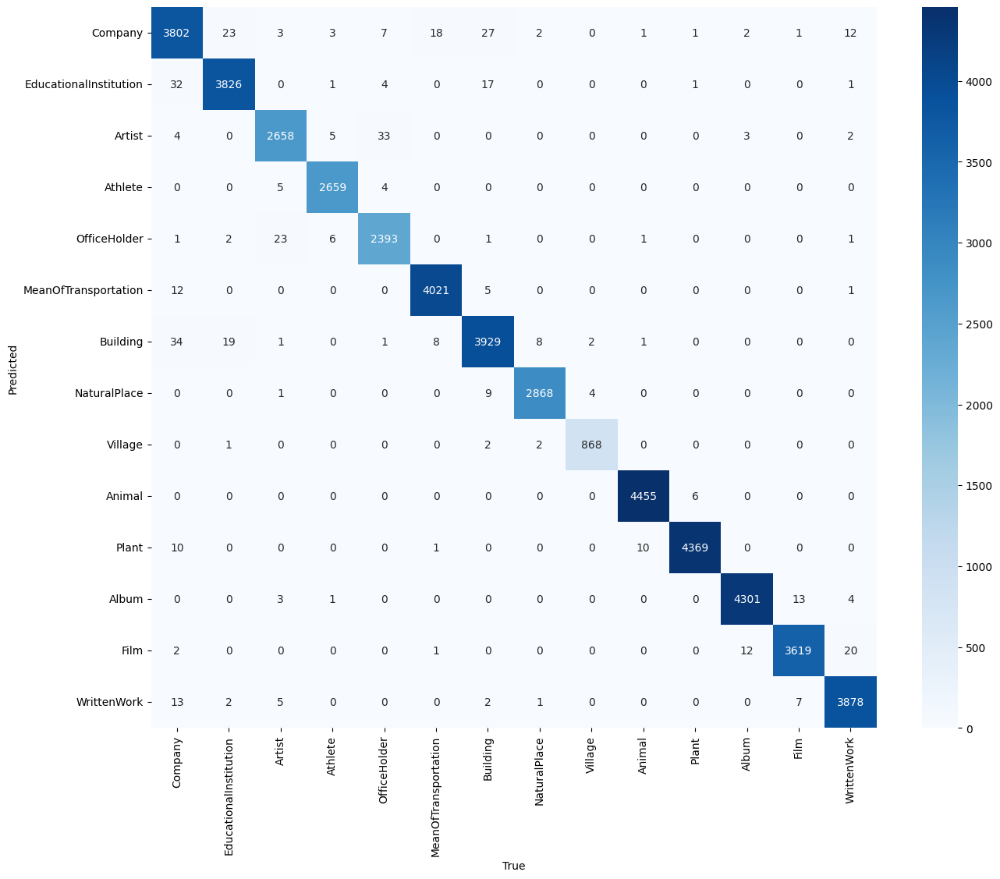

In [220]:
results_df = metrics_per_class(predictions, true_vals, label_names)

In [206]:
labels_flat = np.argmax(true_vals, axis=1)

In [207]:
unique_classes, counts = np.unique(labels_flat, return_counts=True)


In [208]:
percentages = (counts / len(labels_flat)) * 100


In [209]:
for i, label_name in enumerate(label_names):
    print(f"{label_name}: {percentages[i]:.2f}%")


Company: 8.11%
EducationalInstitution: 8.07%
Artist: 5.62%
Athlete: 5.54%
OfficeHolder: 5.05%
MeanOfTransportation: 8.39%
Building: 8.32%
NaturalPlace: 5.99%
Village: 1.81%
Animal: 9.27%
Plant: 9.12%
Album: 8.98%
Film: 7.59%
WrittenWork: 8.12%


In [205]:
results_df

,Company,EducationalInstitution,Artist,Athlete,OfficeHolder,MeanOfTransportation,Building,NaturalPlace,Village,Animal,Plant,Album,Film,WrittenWork
Accuracy,0.974372,0.985574,0.982625,0.996627,0.985585,0.995543,0.981514,0.995142,0.994273,0.998655,0.995216,0.995141,0.990421,0.992323
Precision,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Recall,0.974372,0.985574,0.982625,0.996627,0.985585,0.995543,0.981514,0.995142,0.994273,0.998655,0.995216,0.995141,0.990421,0.992323
F1score,0.987020,0.992735,0.991236,0.998310,0.992740,0.997767,0.990671,0.997565,0.997128,0.999327,0.997602,0.997565,0.995188,0.996147


In [221]:
results_df.to_csv('data/results/models_results/BERT_results.csv')

In [197]:
accuracy_per_class(predictions, true_vals)



Class: 0.0
Accuracy: 3802/3902

Class: 1.0
Accuracy: 3826/3882

Class: 2.0
Accuracy: 2658/2705

Class: 3.0
Accuracy: 2659/2668

Class: 4.0
Accuracy: 2393/2428

Class: 5.0
Accuracy: 4021/4039

Class: 6.0
Accuracy: 3929/4003

Class: 7.0
Accuracy: 2868/2882

Class: 8.0
Accuracy: 868/873

Class: 9.0
Accuracy: 4455/4461

Class: 10.0
Accuracy: 4369/4390

Class: 11.0
Accuracy: 4301/4322

Class: 12.0
Accuracy: 3619/3654

Class: 13.0
Accuracy: 3878/3908



## Error Analysis

In [223]:
max_vals = []
for vector in predictions:

    max_val = np.max(vector)
    max_index = np.where(vector == max_val)[0][0]
    max_vals.append(max_index)
    
data_test["pred"] = max_vals

In [224]:
data_test["correct_pred"] = data_test.apply(lambda row: True if row["pred"]==row["label"] else False, axis = 1)

In [231]:
data_test.to_csv('data/results/models_results/test_errors_BERT.csv')

In [229]:
incorrect_predictions = data_test[data_test['correct_pred'] == False]


In [230]:
incorrect_predictions

,label,title,content,words_count,pred,correct_pred
36,0,Government of the Democratic Republic of the C...,The Government of the Democratic Republic of ...,46,4,False
65,0,Ranik Ultimate Fighting Federation,Ranik Ultimate Fighting Federation (RUFF) is ...,62,3,False
69,0,Maine Chance Farm,Maine Chance Farm was an American Thoroughbre...,67,9,False
81,0,Student Volunteer Campus Community,Student Volunteer Campus Community (abbreviat...,35,1,False
190,0,Joyland Amusement Park,The Joyland Amusement Park is a small family-...,42,6,False
...,...,...,...,...,...,...
47795,13,Pocket Gamer,Pocket Gamer is a video game website that foc...,66,0,False
47797,13,American Society of Church History,The American Society of Church History (ASCH)...,66,0,False
47855,13,Doctor Who Live,Doctor Who Live: The Monsters Are Coming! is ...,20,12,False
47909,13,Callahan's Crosstime Saloon,In the fictional universe of Spider Robinson ...,70,6,False


## Bias

In [244]:
model = BertForSequenceClassification.from_pretrained("bert-base-uncased",
                                                      num_labels=len(label_dict),
                                                      output_attentions=False,
                                                      output_hidden_states=False)

model.to(device)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0): BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, element

In [245]:
model.load_state_dict(torch.load('data/results/models_results/finetuned_BERT_epoch_2.model', map_location=torch.device('cuda')))

<All keys matched successfully>

In [255]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
words = ["man", "boy", "male", "woman", "girl", "female", "european", "caucasian", "african", "asian", 
"indian", "pakistani", "bangladeshi", "chinese", "caribbean", "gypsy", "arab"]
labels = [1 if i < len(words)//2 else 0 for i in range(len(words))]
inputs = tokenizer(words, padding=True, truncation=True, max_length=20, return_tensors='pt')
attention_mask = inputs['attention_mask']
input_ids = inputs['input_ids']
labels = torch.tensor(labels)

dataloader = torch.utils.data.DataLoader(torch.utils.data.TensorDataset(input_ids, attention_mask, labels), batch_size=batch_size)
loss, predictions_words, true_vals = evaluate(dataloader)

In [256]:
bias_results = pd.DataFrame(predictions_words, columns=label_names)
bias_results.index = words
bias_results

,Company,EducationalInstitution,Artist,Athlete,OfficeHolder,MeanOfTransportation,Building,NaturalPlace,Village,Animal,Plant,Album,Film,WrittenWork
man,-4.333322,-3.597023,-3.364857,-3.711730,-4.333508,-4.093316,-4.586336,-5.054307,-4.814567,-4.751137,-3.364946,-3.321927,-3.981220,-1.374318
boy,-4.640215,-2.791195,-2.639102,-3.244845,-3.950088,-3.534320,-4.403486,-4.444491,-4.222125,-4.440500,-3.201125,-3.958873,-3.861678,-1.253760
male,-5.137737,-4.714097,-4.698801,-4.473209,-4.700990,-4.623969,-5.319813,-4.934660,-5.502540,0.141032,-2.607226,-5.376399,-4.850915,-3.554900
woman,-4.161922,-2.439126,-2.768520,-3.104411,-2.969654,-3.609807,-4.092204,-4.446847,-4.634216,-4.450020,-2.774932,-3.525754,-3.539717,-1.428960
girl,-5.216488,-2.824867,-3.574240,-3.542331,-4.687187,-4.404801,-5.114210,-5.389494,-5.397825,-5.208951,-4.154040,-3.815291,-4.334269,-2.292739
female,-4.881694,-4.230158,-4.263146,-3.944008,-4.100175,-4.054778,-4.869246,-4.508557,-5.210115,0.798107,-2.389434,-5.349030,-4.037205,-3.161568
european,-4.106402,-3.948745,-4.916870,-5.117980,-4.956898,-5.127161,-5.213395,-5.560829,-5.310150,-5.288696,-5.075144,-4.675962,-5.526434,-3.789830
caucasian,-3.987833,-1.383443,-1.163367,-2.879517,-2.158469,-3.377378,-2.999831,-3.499325,-3.927954,-4.306753,-1.580119,-4.312832,-2.939128,-1.842735
african,-4.509037,-3.977926,-3.655960,-4.807353,-4.926777,-4.643692,-5.014544,-5.184457,-5.128941,-4.602705,-3.771111,-4.674315,-5.251379,-2.719757
asian,-4.779924,-3.676374,-4.439650,-5.372636,-5.475856,-5.110942,-5.325567,-5.190349,-5.872109,-5.343911,-4.134941,-4.829656,-5.144059,-2.493583


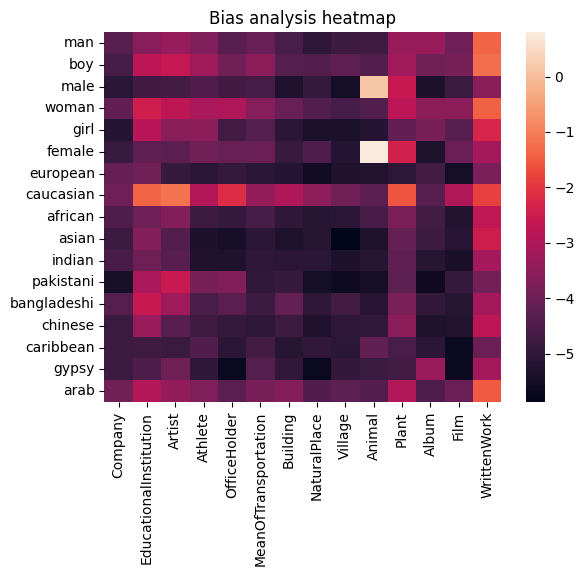

In [259]:
sns.heatmap(bias_results)
plt.title('Bias analysis heatmap')
plt.savefig("images/biass_heatmap_bert.png")

# Predictions examples

class 1: 'EducationalInstitution'
class_names = ['Company', 'EducationalInstitution', 'Artist', 'Athlete', 'OfficeHolder',
              'MeanOfTransportation', 'Building', 'NaturalPlace', 'Village', 'Animal',
              'Plant', 'Album', 'Film','WrittenWork']

## Baseline model examples

In [71]:
BL_predictions = pd.read_csv('data/results/models_results/prediction_df_LR.csv')

/var/folders/yw/h9ndkfbx6_lb6gwchxbgts2m0000gn/T/ipykernel_5992/186064775.py:1: DtypeWarning: Columns (2,3,19) have mixed types. Specify dtype option on import or set low_memory=False.
  BL_predictions = pd.read_csv('data/results/models_results/prediction_df_LR.csv')


In [72]:
BL_predictions = BL_predictions.drop(["Unnamed: 0", "Unnamed: 20", "Unnamed: 21"], axis = 1)
BL_predictions = BL_predictions.dropna(how = "any")

In [85]:
pd.set_option('display.max_colwidth', None)
BL_predictions[BL_predictions["label"] == 13.0][:3][["label","content","Predict"]]

,label,content,Predict
44209,13.0,Priory School is a secondary school in Portsmouth England.,13.0
44210,13.0,Memari College established in 1981 is the general degree college in Memari Burdwan district. It offers undergraduate courses in arts commerce and sciences. It is affiliated to University of Burdwan.,13.0
44211,13.0,Centaurus High School (CHS) is a secondary school located in Lafayette Colorado and part of the Boulder Valley School District.,13.0


In [64]:
BL_predictions[BL_predictions["label"] == 5.0][:3][["label","content","Predict"]]

,label,content,Predict
15585,5.0,Stingray Digital Group is a privately held Canadian media and entertainment company based in Montreal Quebec with American offices in Charlotte North Carolina and English offices in London England.,5.0
15586,5.0,Acorn Computers Ltd. was a British computer company established in Cambridge England in 1978. The company produced a number of computers which were especially popular in the UK. These included the Acorn Electron the BBC Micro and the Acorn Archimedes.,5.0
15587,5.0,The Bank of Melbourne is a financial institution operated in Victoria Australia. A subsidiary of the Westpac Group it commenced operations on 25 July 2011. The Bank of Melbourne initially acquired the Victorian business of St. George Bank another wholly owned subsidiary of the Westpac Group as part of a major local branding strategy. The customer-facing activities of the business operate independently of the Westpac Group. Westpac has owned the rights to the brand since 1997.,5.0


## RNN model examples

In [60]:
RNN_errors = pd.read_csv('data/results/models_results/RNN_errors_analysis.csv')

In [65]:
RNN_errors[RNN_errors["label"] == 1.0][:3][["label","content", "pred"]]

,label,content,pred
3902,1,Murdock Middle School is a suburban-based middle school located in Port Charlotte Florida. Construction initiated in 1986 and the school's first official school year was in 1988. In May 2007 it graduated its 18th 8th grade class. The school's education basis is very oriented around the Sunshine State Standards which are the basis of the Florida Comprehensive Assessment Test (FCAT) which all three grades (Sixth - Eighth) take every year in the month of March.,1
3903,1,Colonel Gray Sr. High School (CGHS) colloquially referred to as The Gray is a Canadian secondary school in Charlottetown Prince Edward Island. Its zone includes students from the central parts of Queens County in the City of Charlottetown.The school is administratively part of the English Language School Board. Its official colours are Maroon and Gray and the mascot is a Colonel. The sports teams from The Gray are called the Colonel Gray Colonels.,1
3904,1,Natuk Vivekananda Vidyamandir also abbreviated as N.V.B is one of the oldest school in the village Natuk of sub-division Ghatal Paschim Medinipur West Bengal India. This school was established by Upendranath Santra in 1896 and named by Gopal Maharaj of Fulchak ashram.,1


In [66]:
RNN_errors[RNN_errors["label"] == 5.0][:3][["label","content", "pred"]]

,label,content,pred
15585,5,The British Rail Class 421 (or 4Cig) electrical multiple units were built at BR York Works between 1964 and 1972. Units were built in two batches and were initially introduced on services on the Brighton Main Line. Later units were introduced on services to Portsmouth. These units replaced older Southern Railway-designed units such as the 5Bel Brighton Belle units and 4Cor units.,5
15586,5,USS Gilmore (DE-18) was an Evarts-class short-hull destroyer escort in the service of the United States Navy named after Commander Walter William Gilmore Supply Corps killed on 8 May 1942 while serving as the supply officer of the Lexington (CV-2) in the Battle of Coral Sea.Originally allocated to the United Kingdom under terms of the Lend-Lease Program the ship was launched as HMS Halder (BDE-18) on 22 October 1942 by Mare Island Naval Shipyard California; sponsored by Mrs. Otis J.,5
15587,5,The GE U33C is a 6-axle diesel-electric locomotive built by GE Transportation Systems between January 1968 and January 1975. 375 examples of this locomotive were built for 11 North American railroads and one construction contractor.,5


## BERT model examples

In [67]:
BERT_errors = pd.read_csv('data/results/models_results/test_errors_BERT.csv')

In [69]:
BERT_errors[BERT_errors["label"] == 1.0][:3][["label","content", "pred"]]

,label,content,pred
3902,1,Murdock Middle School is a suburban-based middle school located in Port Charlotte Florida. Construction initiated in 1986 and the school's first official school year was in 1988. In May 2007 it graduated its 18th 8th grade class. The school's education basis is very oriented around the Sunshine State Standards which are the basis of the Florida Comprehensive Assessment Test (FCAT) which all three grades (Sixth - Eighth) take every year in the month of March.,1
3903,1,Colonel Gray Sr. High School (CGHS) colloquially referred to as The Gray is a Canadian secondary school in Charlottetown Prince Edward Island. Its zone includes students from the central parts of Queens County in the City of Charlottetown.The school is administratively part of the English Language School Board. Its official colours are Maroon and Gray and the mascot is a Colonel. The sports teams from The Gray are called the Colonel Gray Colonels.,1
3904,1,Natuk Vivekananda Vidyamandir also abbreviated as N.V.B is one of the oldest school in the village Natuk of sub-division Ghatal Paschim Medinipur West Bengal India. This school was established by Upendranath Santra in 1896 and named by Gopal Maharaj of Fulchak ashram.,1


In [70]:
BERT_errors[BERT_errors["label"] == 5.0][:3][["label","content", "pred"]]

,label,content,pred
15585,5,The British Rail Class 421 (or 4Cig) electrical multiple units were built at BR York Works between 1964 and 1972. Units were built in two batches and were initially introduced on services on the Brighton Main Line. Later units were introduced on services to Portsmouth. These units replaced older Southern Railway-designed units such as the 5Bel Brighton Belle units and 4Cor units.,5
15586,5,USS Gilmore (DE-18) was an Evarts-class short-hull destroyer escort in the service of the United States Navy named after Commander Walter William Gilmore Supply Corps killed on 8 May 1942 while serving as the supply officer of the Lexington (CV-2) in the Battle of Coral Sea.Originally allocated to the United Kingdom under terms of the Lend-Lease Program the ship was launched as HMS Halder (BDE-18) on 22 October 1942 by Mare Island Naval Shipyard California; sponsored by Mrs. Otis J.,5
15587,5,The GE U33C is a 6-axle diesel-electric locomotive built by GE Transportation Systems between January 1968 and January 1975. 375 examples of this locomotive were built for 11 North American railroads and one construction contractor.,5


# Error analysis

In [88]:
RNN_errors = pd.read_csv('data/results/models_results/RNN_errors_analysis.csv')

In [133]:
# define a dictionary to map label values to lookup values
label_lookup = {0: "Company", 1: "EducationalInstitution", 2: "Artist", 3: "Athlete", 4: "OfficeHolder",
                5: "MeanOfTransportation", 6: "Building", 7: "NaturalPlace", 8: "Village", 9: "Animal",
                10: "Plant", 11: "Album", 12: "Film", 13: "WrittenWork"}

# use pivot_table to count False values by label and pred
false_counts = pd.pivot_table(RNN_errors[RNN_errors["correct_pred"] == False], index="label", columns="pred", values="correct_pred", aggfunc="count")

# rename the index using the label lookup dictionary
false_counts.rename(index=label_lookup, inplace=True)

# sort the table by the highest count of False values
false_counts_sorted = false_counts.sum(axis=1).sort_values(ascending=False)

# print the sorted table
print(false_counts_sorted)


label
Company                   157.0
Building                   91.0
Artist                     72.0
WrittenWork                72.0
EducationalInstitution     71.0
Film                       61.0
MeanOfTransportation       51.0
OfficeHolder               45.0
Album                      44.0
Animal                     41.0
NaturalPlace               25.0
Athlete                    21.0
Plant                      14.0
Village                     8.0
dtype: float64


In [134]:
# define a dictionary to map label values to lookup values
label_lookup = {0: "Company", 1: "EducationalInstitution", 2: "Artist", 3: "Athlete", 4: "OfficeHolder",
                5: "MeanOfTransportation", 6: "Building", 7: "NaturalPlace", 8: "Village", 9: "Animal",
                10: "Plant", 11: "Album", 12: "Film", 13: "WrittenWork"}

# use pivot_table to count False values by label and pred
false_counts = pd.pivot_table(RNN_errors[RNN_errors["correct_pred"] == False], index="label", columns="pred", values="correct_pred", aggfunc="count")

# rename the columns and index labels
false_counts.rename(columns={"count": "Count of false predictions"}, index=label_lookup, inplace=True)
false_counts.index.name = "True Category"

# sort the table by the highest count of False values
false_counts_sorted = false_counts.sum(axis=1).sort_values(ascending=False)

# print the sorted table
(false_counts_sorted)


True Category
Company                   157.0
Building                   91.0
Artist                     72.0
WrittenWork                72.0
EducationalInstitution     71.0
Film                       61.0
MeanOfTransportation       51.0
OfficeHolder               45.0
Album                      44.0
Animal                     41.0
NaturalPlace               25.0
Athlete                    21.0
Plant                      14.0
Village                     8.0
dtype: float64

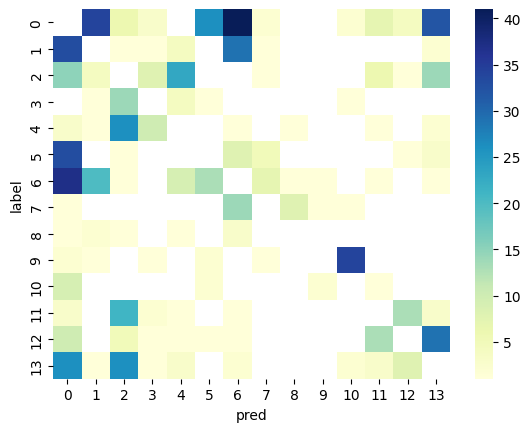

In [135]:
# use pivot_table to count False values by label and pred
false_counts = pd.pivot_table(RNN_errors[RNN_errors["correct_pred"] == False], index="label", columns="pred", values="correct_pred", aggfunc="count")

# create a heatmap of the false_counts table using seaborn
sns.heatmap(false_counts, cmap="YlGnBu")

# show the plot
plt.show()


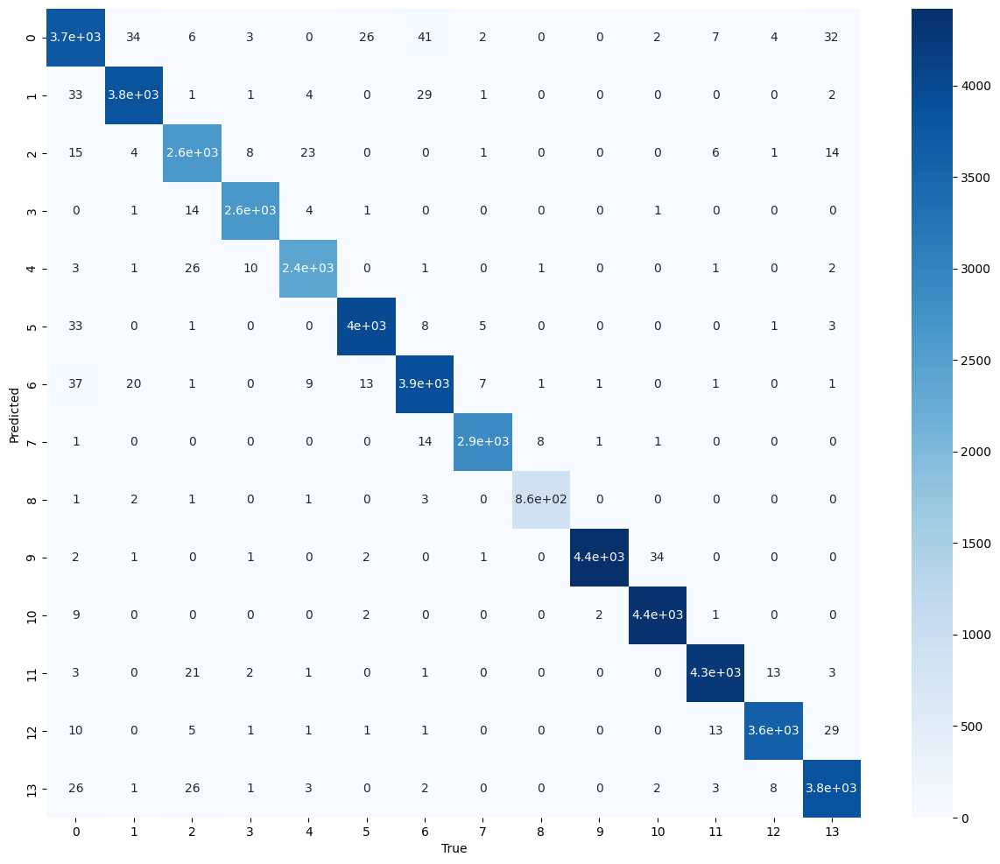

In [136]:
# generate the confusion matrix
cm = confusion_matrix(RNN_errors["label"], RNN_errors["pred"], labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13])

# plot the confusion matrix as a heatmap using seaborn
plt.figure(figsize=(15,12))
sns.heatmap(cm, cmap="Blues", annot=True)
plt.xlabel('True')
plt.ylabel('Predicted')

# show the plot
plt.show()


## Base Line Model 

In [89]:
BL_errors = pd.read_csv('data/results/models_results/prediction_df_LR.csv')

/var/folders/hj/n94x31sj08bdmgwjs6ybxbf40000gn/T/ipykernel_28853/3871639168.py:1: DtypeWarning: Columns (2,3,19) have mixed types. Specify dtype option on import or set low_memory=False.
  BL_errors = pd.read_csv('data/results/models_results/prediction_df_LR.csv')


In [138]:
(BL_errors.dtypes)

Unnamed: 0      float64
label           float64
title            object
content          object
Prob. 0         float64
Prob. 1         float64
Prob. 2         float64
Prob. 3         float64
Prob. 4         float64
Prob. 5         float64
Prob. 6         float64
Prob. 7         float64
Prob. 8         float64
Prob. 9         float64
Prob. 10        float64
Prob. 11        float64
Prob. 12        float64
Prob. 13        float64
Predict         float64
correct_pred     object
Unnamed: 20     float64
Unnamed: 21     float64
dtype: object

In [139]:
# define a dictionary to map label values to lookup values
label_lookup = {0: "Company", 1: "EducationalInstitution", 2: "Artist", 3: "Athlete", 4: "OfficeHolder",
                5: "MeanOfTransportation", 6: "Building", 7: "NaturalPlace", 8: "Village", 9: "Animal",
                10: "Plant", 11: "Album", 12: "Film", 13: "WrittenWork"}

# use pivot_table to count False values by label and pred
false_counts = pd.pivot_table(BL_errors[BL_errors["correct_pred"] == False], index="label", columns="Predict", values="correct_pred", aggfunc="count")

# rename the columns and index labels
false_counts.rename(columns={"count": "Count of false predictions"}, index=label_lookup, inplace=True)
false_counts.index.name = "True Category"

# sort the table by the highest count of False values
false_counts_sorted = false_counts.sum(axis=1).sort_values(ascending=False)

# print the sorted table
(false_counts_sorted)


True Category
Company                   207.0
Building                  137.0
WrittenWork               110.0
Artist                    106.0
EducationalInstitution     88.0
Film                       75.0
OfficeHolder               53.0
Album                      50.0
Plant                      37.0
MeanOfTransportation       35.0
Animal                     35.0
NaturalPlace               27.0
Athlete                    21.0
Village                    15.0
dtype: float64

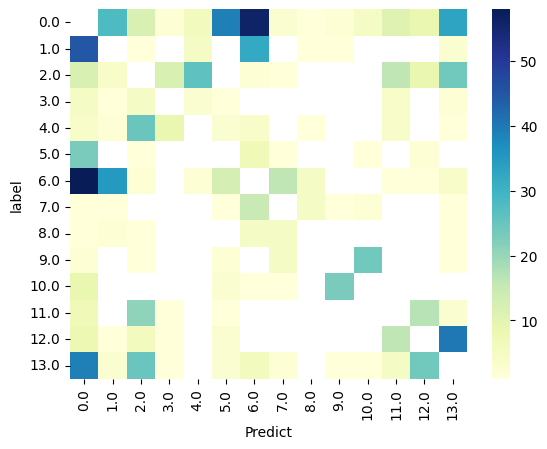

In [140]:
# use pivot_table to count False values by label and pred
false_counts = pd.pivot_table(BL_errors[BL_errors["correct_pred"] == False], index="label", columns="Predict", values="correct_pred", aggfunc="count")

# create a heatmap of the false_counts table using seaborn
sns.heatmap(false_counts, cmap="YlGnBu")

# show the plot
plt.show()

In [141]:
# output the BL_errors DataFrame to a CSV file
BL_errors.to_csv("data/results/models_results/BL_errors.csv", index=False)


## This chart shows "when there was a false prediction, how close was the model to predicting the correct answer"

In [154]:
# create a new column called "conf_wrong"
BL_errors["conf_wrong"] = 0

# loop over the rows in the DataFrame
for i, row in BL_errors.iterrows():
    try:
        # if correct_pred is False, set conf_wrong to the appropriate Prob. column value
        if not row["correct_pred"]:
            col_name = "Prob. " + str(int(row["label"]))
            col_idx = BL_errors.columns.get_loc(col_name)
            BL_errors.at[i, "conf_wrong"] = row.iloc[col_idx]
        # if correct_pred is True, conf_wrong remains 0
    except KeyError:
        # if there is a KeyError (e.g. column name doesn't exist), set conf_wrong to 0 and print row number
        BL_errors.at[i, "conf_wrong"] = 0
        print("Error at row", i)

# print the updated DataFrame
print(BL_errors)


        Unnamed: 0  label                              title  \
0              0.0    0.0                   E. D. Abbott Ltd   
1              1.0    0.0                     Schwan-Stabilo   
2              2.0    0.0  Marvell Software Solutions Israel   
3              3.0    0.0        Bergan Mercy Medical Center   
4              4.0    0.0                 The Unsigned Guide   
...            ...    ...                                ...   
384686         NaN    NaN                                NaN   
384687         NaN    NaN                                NaN   
384688         NaN    NaN                                NaN   
384689         NaN    NaN                                NaN   
384690         NaN    NaN                                NaN   

                                                  content   Prob. 0  \
0        Abbott of Farnham E D Abbott Limited was a Br...  0.910951   
1        Schwan-STABILO is a German maker of pens for ...  1.000000   
2        Marvell S

C:\Users\no_mi\AppData\Local\Temp\ipykernel_41956\3816522020.py:22: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  print(BL_errors)


### After training vocabulary specifc to the persistent errors, this TFIDF can be added to the training models. 
### The chart shows "when there was a false prediction, how close was the model to predicting the correct answer" - for the baseline model

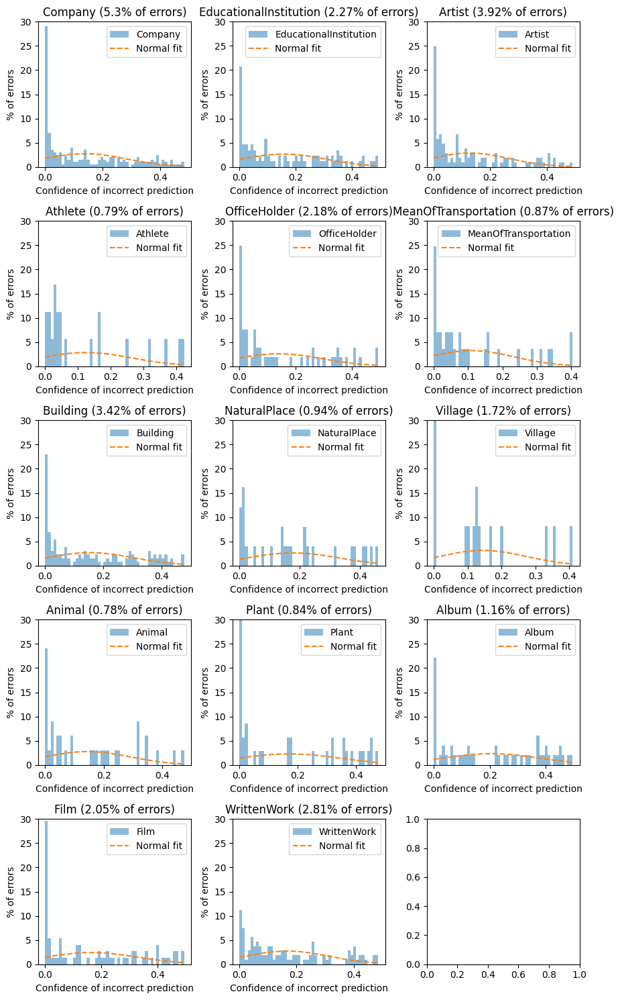

In [155]:
# with columns "label", "correct_pred", "Pred", "Prob. 0", "Prob. 1", ..., "Prob. 13", and "conf_wrong"

# create a dictionary to map label values to lookup values
label_lookup = {0: "Company", 1: "EducationalInstitution", 2: "Artist", 3: "Athlete", 4: "OfficeHolder",
                5: "MeanOfTransportation", 6: "Building", 7: "NaturalPlace", 8: "Village", 9: "Animal",
                10: "Plant", 11: "Album", 12: "Film", 13: "WrittenWork"}

# set the y-axis limit to 30%
y_limit = 30
x_limit = 0.5

# loop over the labels and plot a histogram for each
fig, axs = plt.subplots(nrows=5, ncols=3, figsize=(9, 15), tight_layout=True)
for i, (label_value, label_name) in enumerate(label_lookup.items()):
    # select the rows with the current label value and exclude conf_wrong values of 0
    conf_wrong_values = BL_errors[(BL_errors["label"] == label_value) & (BL_errors["conf_wrong"] != 0)]["conf_wrong"]
    
    # calculate proportion of errors
    prop_errors = (len(conf_wrong_values) / len(BL_errors[BL_errors["label"] == label_value])) * 100

    # plot the histogram using numpy and matplotlib
    ax = axs[i//3, i%3]  # select the appropriate subplot
    n, bins, patches = ax.hist(conf_wrong_values, bins=50, density=True, alpha=0.5, label=label_name)
    y = ((1 / (np.sqrt(2 * np.pi) * np.std(conf_wrong_values))) *
         np.exp(-0.5 * (1 / np.std(conf_wrong_values) * (bins - np.mean(conf_wrong_values))) ** 2))
    ax.plot(bins, y, '--', label='Normal fit')
    ax.set_xlabel('Confidence of incorrect prediction')
    ax.set_ylabel('% of errors')
    ax.set_title( label_name + ' ({}% of errors)'.format(round(prop_errors, 2)))
    ax.set_ylim([0, y_limit])
    ax.legend()

# show the plot
plt.show()


## Could these charts be good? 

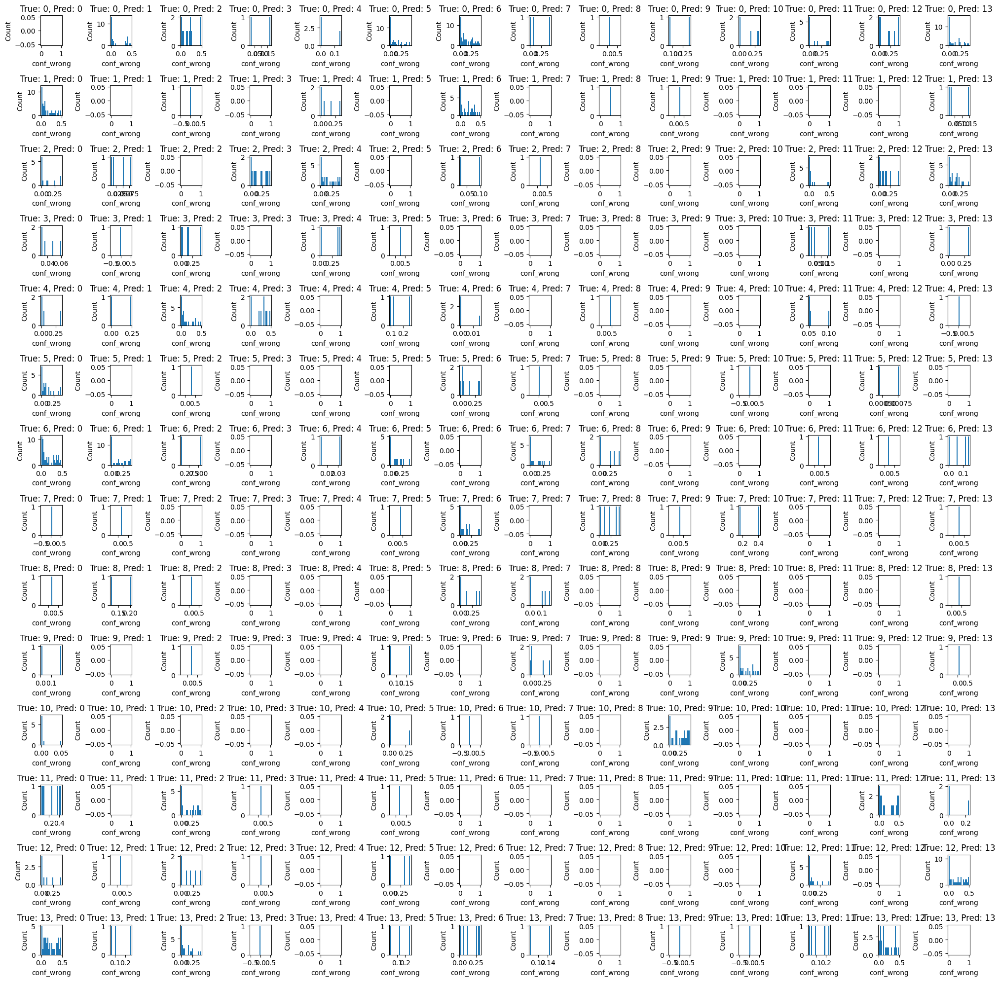

In [156]:
# create a 14x14 grid of subplots
fig, axs = plt.subplots(14, 14, figsize=(20, 20))

# loop over the combinations of label and Pred values
for i in range(14):
    for j in range(14):
        # select the rows where label and Pred match the current combination
        label_val = i
        pred_val = j
        subset = BL_errors[(BL_errors["label"] == label_val) & (BL_errors["Predict"] == pred_val)]
        # plot a histogram of non-zero conf_wrong values for the current combination
        axs[i, j].hist(subset[subset["conf_wrong"] != 0]["conf_wrong"], bins=20)
        axs[i, j].set_title("True: {}, Pred: {}".format(label_val, pred_val))
        axs[i, j].set_xlabel("conf_wrong")
        axs[i, j].set_ylabel("Count")

# adjust the layout of the subplots
fig.tight_layout()

# show the plot
plt.show()


## BERT Model 

In [90]:
BERT_errors = pd.read_csv('data/results/models_results/test_errors_BERT.csv')

In [146]:
(BERT_errors.dtypes)

Unnamed: 0       int64
label            int64
title           object
content         object
words_count      int64
pred             int64
correct_pred      bool
dtype: object

In [157]:
# define a dictionary to map label values to lookup values
label_lookup = {0: "Company", 1: "EducationalInstitution", 2: "Artist", 3: "Athlete", 4: "OfficeHolder",
                5: "MeanOfTransportation", 6: "Building", 7: "NaturalPlace", 8: "Village", 9: "Animal",
                10: "Plant", 11: "Album", 12: "Film", 13: "WrittenWork"}

# use pivot_table to count False values by label and pred
false_counts = pd.pivot_table(BERT_errors[BERT_errors["correct_pred"] == False], index="label", columns="pred", values="correct_pred", aggfunc="count")

# rename the columns and index labels
false_counts.rename(columns={"count": "Count of false predictions"}, index=label_lookup, inplace=True)
false_counts.index.name = "True Category"

# sort the table by the highest count of False values
false_counts_sorted = false_counts.sum(axis=1).sort_values(ascending=False)

# print the sorted table
(false_counts_sorted)


True Category
Company                   100.0
Building                   74.0
EducationalInstitution     56.0
Artist                     47.0
OfficeHolder               35.0
Film                       35.0
WrittenWork                30.0
Plant                      21.0
Album                      21.0
MeanOfTransportation       18.0
NaturalPlace               14.0
Athlete                     9.0
Animal                      6.0
Village                     5.0
dtype: float64

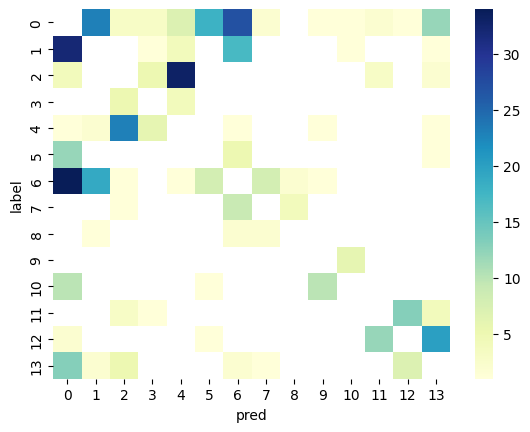

In [158]:

# use pivot_table to count False values by label and pred
false_counts = pd.pivot_table(BERT_errors[BERT_errors["correct_pred"] == False], index="label", columns="pred", values="correct_pred", aggfunc="count")

# create a heatmap of the false_counts table using seaborn
sns.heatmap(false_counts, cmap="YlGnBu")

# show the plot
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

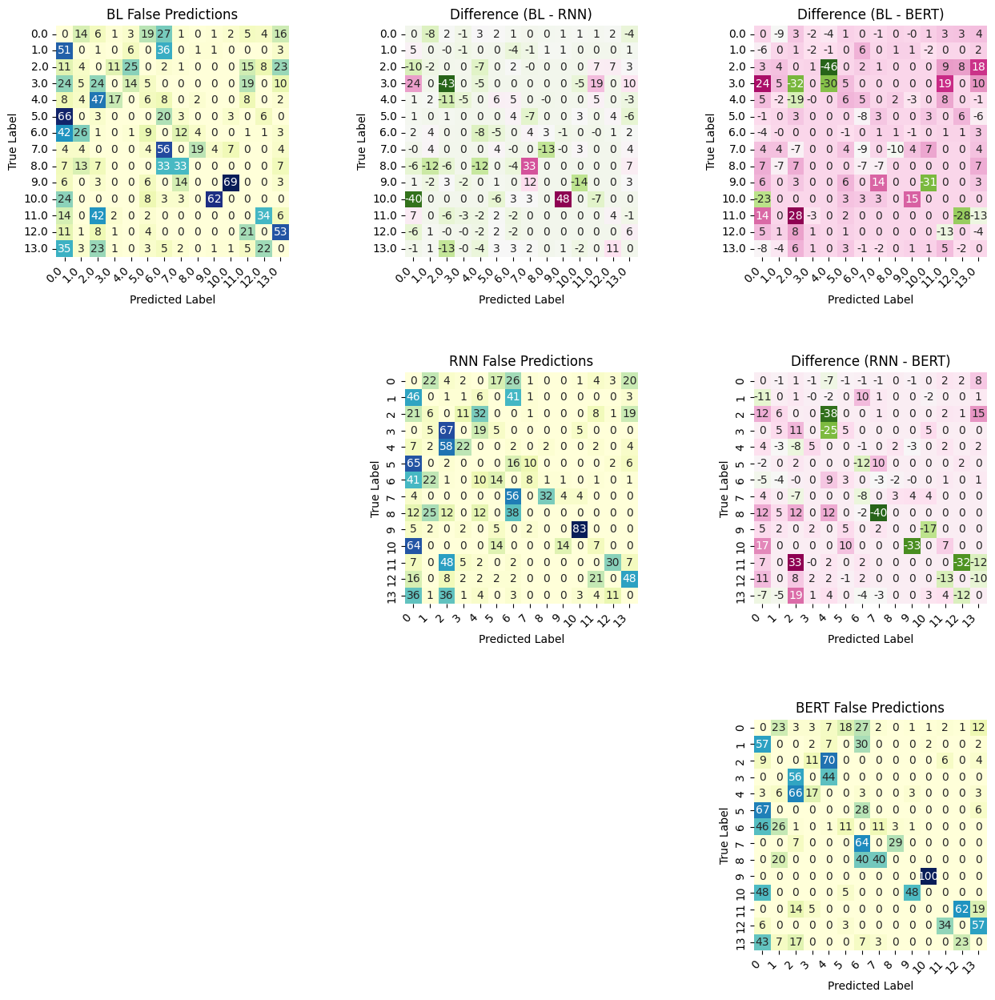

In [168]:
# create pivot tables to count False values by label and pred for each model
false_counts_bl = pd.pivot_table(BL_errors[BL_errors["correct_pred"] == False], index="label", columns="Predict", values="correct_pred", aggfunc="count", fill_value=0)
false_counts_rnn = pd.pivot_table(RNN_errors[RNN_errors["correct_pred"] == False], index="label", columns="pred", values="correct_pred", aggfunc="count", fill_value=0)
false_counts_bert = pd.pivot_table(BERT_errors[BERT_errors["correct_pred"] == False], index="label", columns="pred", values="correct_pred", aggfunc="count", fill_value=0)

# normalize pivot tables to show % of wrong predictions for each label
false_counts_norm_bl = false_counts_bl.div(false_counts_bl.sum(axis=1), axis=0) * 100
false_counts_norm_rnn = false_counts_rnn.div(false_counts_rnn.sum(axis=1), axis=0) * 100
false_counts_norm_bert = false_counts_bert.div(false_counts_bert.sum(axis=1), axis=0) * 100

# calculate percentage difference between pairs of models
diff_counts_br = (false_counts_norm_bl - false_counts_norm_rnn).round(2)
diff_counts_rb = 0*(false_counts_norm_rnn - false_counts_norm_bl).round(2)
diff_counts_bb = (false_counts_norm_bl - false_counts_norm_bert).round(2)
diff_counts_bertb = 0*(false_counts_norm_bert - false_counts_norm_bl).round(2)
diff_counts_rr = (false_counts_norm_rnn - false_counts_norm_bert).round(2)
diff_counts_bertr = 0*(false_counts_norm_bert - false_counts_norm_rnn).round(2)

# create subplots and plot heatmaps for each difference pivot table
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))

sns.heatmap(false_counts_norm_bl, cmap="YlGnBu", annot=True, fmt=".0f", cbar=False, ax=axs[0,0])
axs[0,0].set_title("BL False Predictions")
axs[0,0].set_xlabel("Predicted Label")
axs[0,0].set_ylabel("True Label")
axs[0,0].set_xticklabels(axs[0,0].get_xticklabels(), rotation=45, horizontalalignment='right')

sns.heatmap(false_counts_norm_rnn, cmap="YlGnBu", annot=True, fmt=".0f", cbar=False, ax=axs[1,1])
axs[1,1].set_title("RNN False Predictions")
axs[1,1].set_xlabel("Predicted Label")
axs[1,1].set_ylabel("True Label")
axs[1,1].set_xticklabels(axs[1,1].get_xticklabels(), rotation=45, horizontalalignment='right')

sns.heatmap(false_counts_norm_bert, cmap="YlGnBu", annot=True, fmt=".0f", cbar=False, ax=axs[2,2])
axs[2,2].set_title("BERT False Predictions")
axs[2,2].set_xlabel("Predicted Label")
axs[2,2].set_ylabel("True Label")
axs[2,2].set_xticklabels(axs[2,2].get_xticklabels(), rotation=45, horizontalalignment='right')

# create heatmap for difference between BL and RNN
sns.heatmap(diff_counts_br, cmap="PiYG_r", annot=True, fmt=".0f", cbar=False, ax=axs[0,1])
axs[0,1].set_title("Difference (BL - RNN)")
axs[0,1].set_xlabel("Predicted Label")
axs[0,1].set_ylabel("True Label")
axs[0,1].set_xticklabels(axs[0,1].get_xticklabels(), rotation=45, horizontalalignment='right')

axs[1,0].axis('off')

# create heatmap for difference between BL and BERT
sns.heatmap(diff_counts_bb, cmap="PiYG_r", annot=True, fmt=".0f", cbar=False, ax=axs[0,2])
axs[0,2].set_title("Difference (BL - BERT)")
axs[0,2].set_xlabel("Predicted Label")
axs[0,2].set_ylabel("True Label")
axs[0,2].set_xticklabels(axs[0,2].get_xticklabels(), rotation=45, horizontalalignment='right')

axs[2,0].axis('off')

# create heatmap for difference between RNN and BERT
sns.heatmap(diff_counts_rr, cmap="PiYG_r", annot=True, fmt=".0f", cbar=False, ax=axs[1,2])
axs[1,2].set_title("Difference (RNN - BERT)")
axs[1,2].set_xlabel("Predicted Label")
axs[1,2].set_ylabel("True Label")
axs[1,2].set_xticklabels(axs[1,2].get_xticklabels(), rotation=45, horizontalalignment='right')

axs[2,1].axis('off')

# adjust layout and show plot
plt.subplots_adjust(wspace=0.5, hspace=0.5)
plt.show



In [169]:
# select rows with label == 0 and pred == 6
selected_rows = RNN_errors[(RNN_errors["label"] == 0) & (RNN_errors["pred"] == 6)]

# save selected rows to a CSV file
selected_rows.to_csv("data/results/models_results/selected_rows.csv", index=False)


#### Our focus has been to compare false predictions between models, and how close the modes were to being correct. Analysis shown below where there are persistent errors between models and an idea how to improve categorisation. 

#### Below shows false predicitons comparing true and predicted categories.

![image.png](./images/Error%20Analysis%201.png)

![image.png](./images/Error%20Analysis%202.png)